<a href="https://colab.research.google.com/github/suchismita-priya/airbnb_booking_analysis/blob/main/Bike_sharing_demand_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -



##### **Project Type**    - Regression
##### **Contribution**    - Individual
##### **Team Member 1 -** Suchismita Priyadarsinee

# **Project Summary -**

Write the summary here within 500-600 words.

Bike sharing systems are new generation of traditional bike rentals where whole process from membership, rental and return back has become automatic. Through these systems, user is able to easily rent a bike from a particular position and return back at another position. Currently, there are about over 500 bike-sharing programs around the world which is composed of over 500 thousands bicycles. Today, there exists great interest in these systems due to their important role in traffic, environmental and health issues.

Apart from interesting real world applications of bike sharing systems, the characteristics of data being generated by these systems make them attractive for the research. Opposed to other transport services such as bus or subway, the duration of travel, departure and arrival position is explicitly recorded in these systems. This feature turns bike sharing system into a virtual sensor network that can be used for sensing mobility in the city. Hence, it is expected that most of important events in the city could be detected via monitoring these data.


**Data Description**
The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.

Attribute Information: Date : year-month-day

Rented Bike count - Count of bikes rented at each hour

Hour - Hour of he day

Temperature-Temperature in Celsius

Humidity - %

Windspeed - m/s

Visibility - 10m

Dew point temperature - Celsius

Solar radiation - MJ/m2

Rainfall - mm

Snowfall - cm

Seasons - Winter, Spring, Summer, Autumn

Holiday - Holiday/No holiday

Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

# **GitHub Link -**

https://github.com/suchismita-priya/bike_sharing_demand_prediction

# **Problem Statement**


Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from scipy import stats
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

from sklearn.decomposition import PCA

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score ,accuracy_score,roc_auc_score,roc_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso

!pip install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 7.3 MB/s eta 0:00:00


### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# Load Dataset
file_path= '/content/drive/MyDrive/SeoulBikeData.csv'

# Reading CSV file.
original_df=pd.read_csv(file_path,encoding="latin")

### Dataset First View

In [ ]:
# Dataset First Look
original_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
df = original_df.copy()
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
rows_col_count = df.shape

In [ ]:
print('Number of rows are', rows_col_count[0] )
print('Number of columns are', rows_col_count[1] )

Number of rows are 8760
Number of columns are 14


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec


1.   Here we can see we have 8760 rows and 14 columns.

2.   we don't have any null value.

3.   Columns to convert:
      Date - proper datetime format
      Seasons,Holiday,Functioning Day - these all need to convert to numeric.

In [ ]:
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [ ]:
# As it would be difficult from all these column names to copy , so we can rename the columns
df.rename(columns={'Rented Bike Count':'Rented Bike Count','Temperature(°C)':'Temperature','Humidity(%)':'Humidity','Wind speed (m/s)':'Wind_speed',
                       'Visibility (10m)':'Visibility','Dew point temperature(°C)':'Dew_point_temperature', 'Solar Radiation (MJ/m2)':'Solar_Radiation',
                        'Rainfall(mm)':'Rainfall','Snowfall (cm)':'Snowfall','Functioning Day':'Functioning_Day'},inplace=True)
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day'],
      dtype='object')

#### Duplicate Values

When there are identical instances in a dataset, it is referred to as "duplication." Such duplication could occur due to erroneous data entry or data collection procedures. Eliminating duplicate data from the dataset saves time and money by avoiding the repetition of the same data sent to the machine learning model.

In [ ]:
# Dataset Duplicate Value Count
len(df[df.duplicated()])

0

We found that there is no duplicate entry in the above data.

#### Missing Values/Null Values

Why dealing with missing values is necessary?

Real-world data often contains numerous missing values, which can be due to data corruption or other factors. As many machine-learning algorithms do not support missing values, it is necessary to handle them during the dataset pre-processing stage. Thus, the first step in dealing with missing data is to identify the missing values.

In [ ]:
# Missing Values/Null Values Count
df.isnull().sum()

Date                     0
Rented Bike Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
dtype: int64

<Axes: >

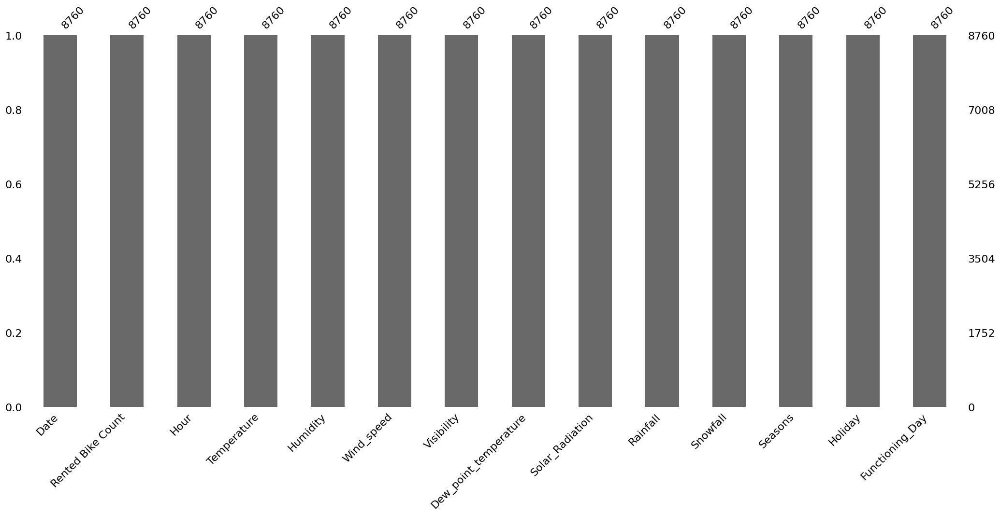

In [ ]:
# Visualizing the missing values
import missingno as msno
msno.bar(df)

### What did you know about your dataset?

From our dataset it is clear that there is no null value present and also no duplicated values.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,01/12/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


### Variables Description

The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.

**Attribute Information:**

Date :year-month-day

Rented Bike count :Count of bikes rented at each hour

Hour :Hour of the day

Temperature :Temperature in Celsius

Humidity :%

Windspeed :m/s

Visibility :10m

Dew point temperature :Celsius

Solar radiation :MJ/m2

Rainfall :mm

Snowfall :cm

Seasons :Winter, Spring, Summer, Autumn

Holiday :Holiday/No holiday

Functional Day :NoFunc(Non Functional Hours), Fun(Functional hours)

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
df.nunique()

Date                      365
Rented Bike Count        2166
Hour                       24
Temperature               546
Humidity                   90
Wind_speed                 65
Visibility               1789
Dew_point_temperature     556
Solar_Radiation           345
Rainfall                   61
Snowfall                   51
Seasons                     4
Holiday                     2
Functioning_Day             2
dtype: int64

We are focusing on several key columns of our dataset, including 'Hour', 'Holiday', 'Functioning Day', 'Rented Bike Count', 'Temperature(°C)', and 'Seasons', as they contain a wealth of information.

By utilizing these features, we plan to create a regression model and implement various regression algorithms.

There is a column 'Hour' which might be considered a categorical feature or maybe a numerical feature based on the data we will try both and see the result difference.

## 3. ***Data Wrangling***

### Data Wrangling Code

Data wrangling, also known as data preprocessing, refers to the process of cleaning, structuring, and transforming raw data into a format suitable for analysis or other data-related tasks. It is a crucial step in the data preparation pipeline, as raw data often comes in various forms and may have inconsistencies, missing values, and other issues that need to be addressed before meaningful analysis can take place.

Key tasks involved in data wrangling include:

**Data Cleaning**: Identifying and handling missing data, outliers, duplicates, and errors. This may involve imputing missing values, removing duplicate records, and correcting inaccuracies.

**Data Transformation**: Converting data into a common format, such as changing data types, normalizing or scaling numeric values, and encoding categorical variables into numerical values (e.g., one-hot encoding).

**Data Integration**: Combining data from multiple sources or files into a unified dataset. This may involve merging datasets, aligning data based on common keys, or aggregating data at different levels.

**Data Reduction**: Reducing the dimensionality of data by selecting relevant features or variables and discarding irrelevant or redundant ones. This can improve the efficiency of modeling and analysis.

**Data Exploration**: Exploring and visualizing the data to gain insights, identify patterns, and detect relationships. This helps in making informed decisions during the wrangling process.

Data wrangling is a critical step in the data analysis pipeline because the quality and structure of the data significantly impact the accuracy and reliability of the insights and models derived from it. Effective data wrangling ensures that the data is ready for analysis, reporting, or machine learning tasks.

In [ ]:
# Write your code to make your dataset analysis ready.
# Breaking down date column
df["Date"] = pd.to_datetime(df["Date"])

df["weekday"] = df["Date"].dt.day_name()
df["Day"] = df["Date"].dt.day
df["Month"] = df["Date"].dt.month
df["Year"] = df["Date"].dt.year

df.drop("Date", axis=1, inplace=True)

In [ ]:
# check the Newly Created columns
df.head(2)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,weekday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented Bike Count      8760 non-null   int64  
 1   Hour                   8760 non-null   int64  
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  weekday                8760 non-null   object 
 14  Day                    8760 non-null   int64  
 15  Mont

### What all manipulations have you done and insights you found?

From the data we knew that there is no null or duplicate value.so we don't need to treat that.
Date should be in datatime format.


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [ ]:
num_vars = list(df.select_dtypes(exclude=['object']))
num_vars

['Rented Bike Count',
 'Hour',
 'Temperature',
 'Humidity',
 'Wind_speed',
 'Visibility',
 'Dew_point_temperature',
 'Solar_Radiation',
 'Rainfall',
 'Snowfall',
 'Day',
 'Month',
 'Year']

In [ ]:
#for i in num_vars:
#  sns.boxplot(y = df[i])
#  plt.show()

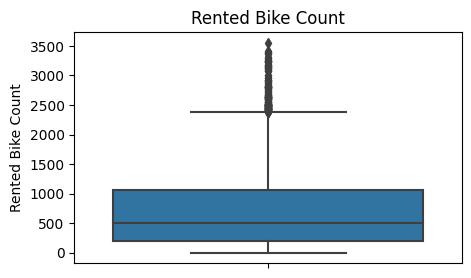

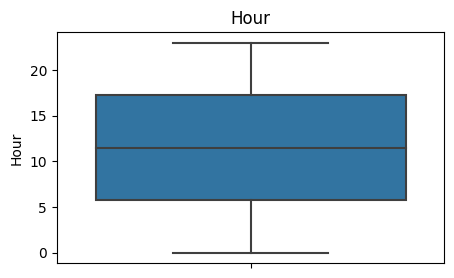

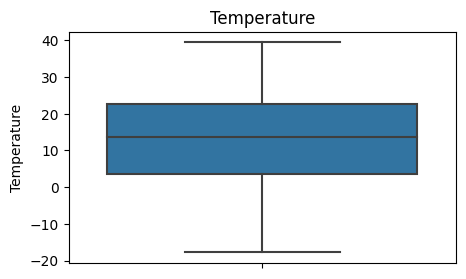

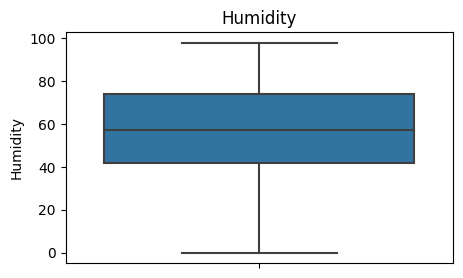

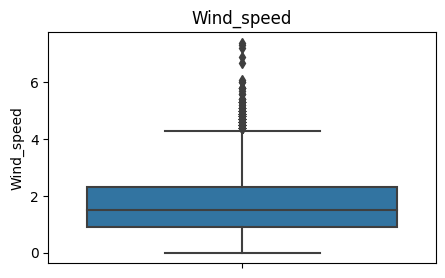

...

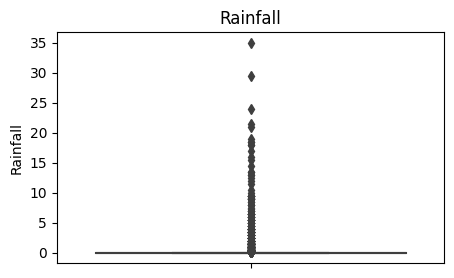

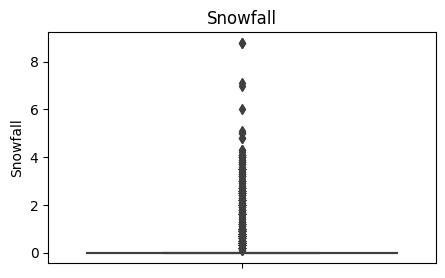

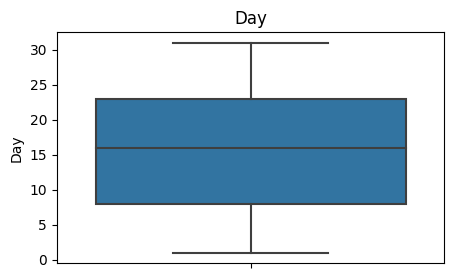

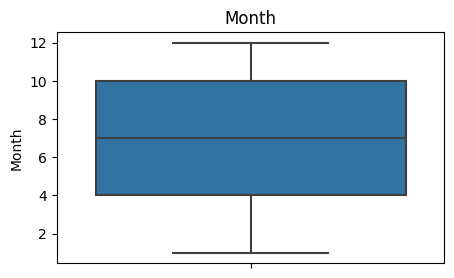

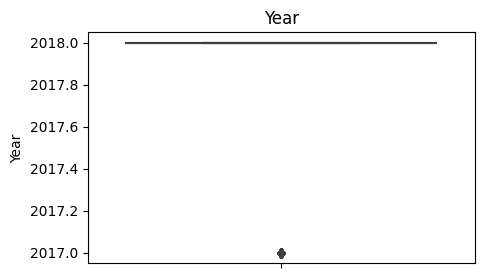

In [ ]:
# Chart - 1 visualization code
# priting box plot of numeric columns to check oultliers
for i in num_vars:
  fig = plt.figure(figsize=(5,3))
  ax = fig.gca()
  sns.boxplot(y = df[i] , ax=ax)
  ax.set_title(i)
  plt.show()


##### 1. Why did you pick the specific chart?

For Numeric variable some plots are good from this boxplot is there.
This comes under univariate analysis.On this we will see indivisual variables one at a time.

##### 2. What is/are the insight(s) found from the chart?

Outliers are visible in the 'wind_speed', and 'solar_radiation' columns.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes from above we got to know on which dataset there are outliers and in below steps we'll remove these outliers to make data more efficient and model ready.

#### Chart - 2

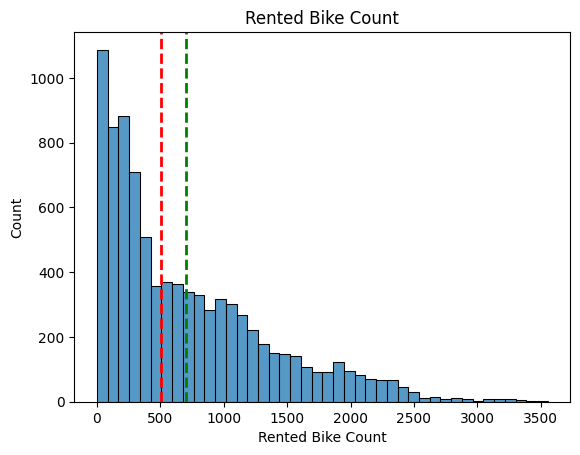

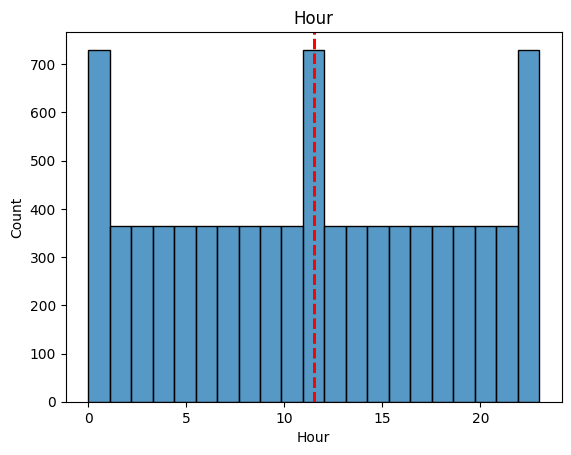

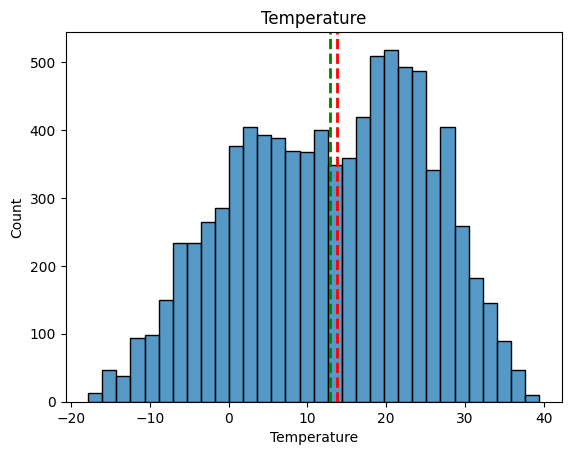

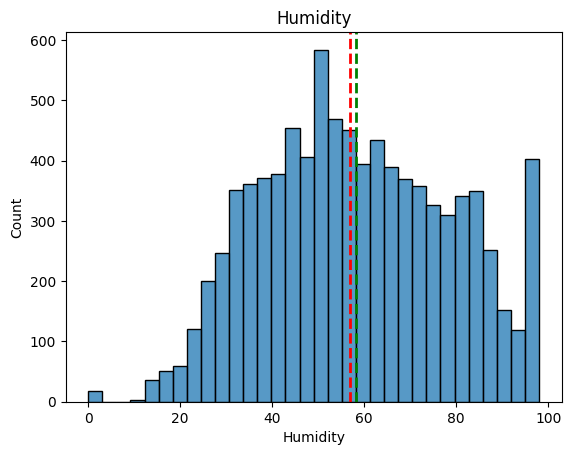

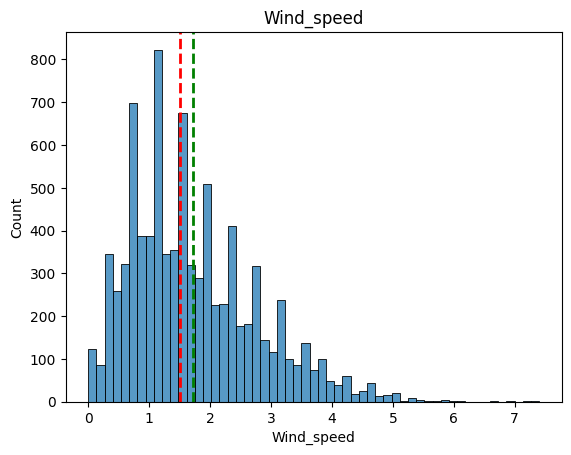

...

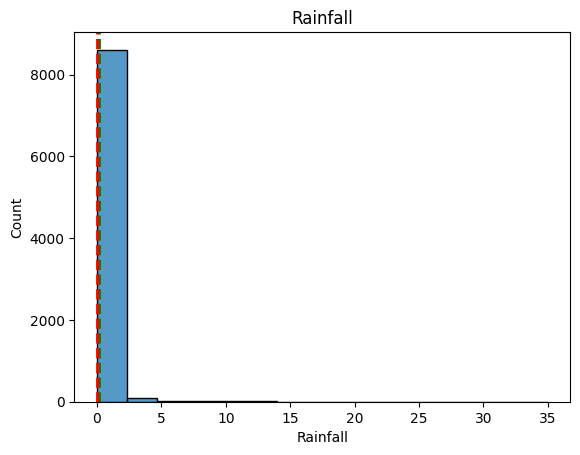

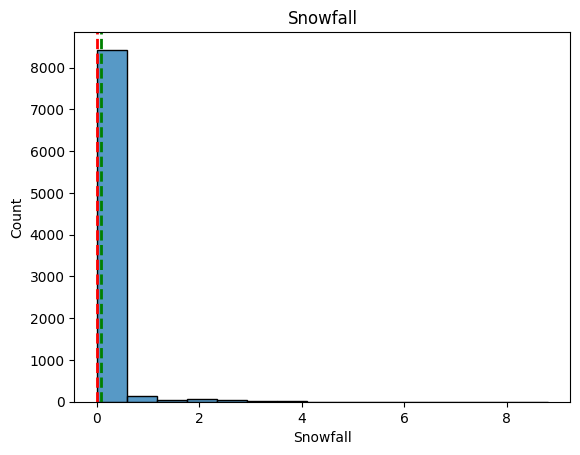

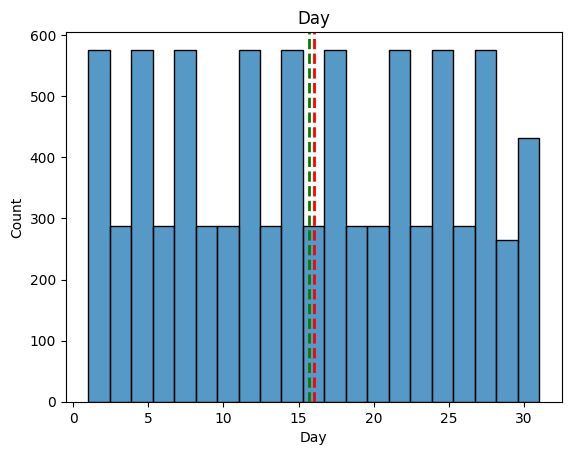

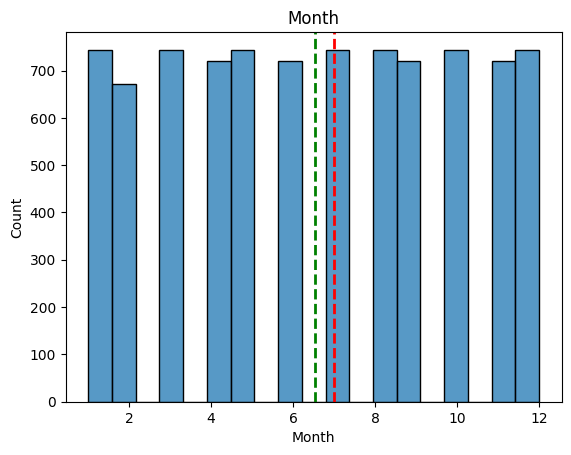

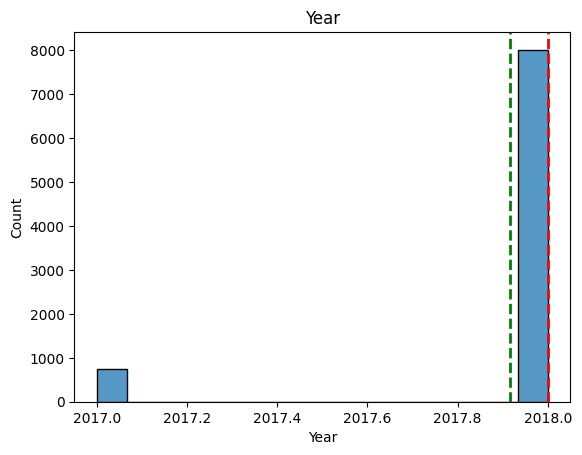

In [ ]:
# Chart - 2 visualization code
# Histogram
for i in num_vars:
  sns.histplot(x = df[i])
  plt.axvline(df[i].mean(), color='g', linestyle='dashed', linewidth=2)
  plt.axvline(df[i].median(), color='red', linestyle='dashed', linewidth=2)
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

They allow you to see how data is spread out, whether it's symmetric or skewed, and whether there are any outliers.
Outliers often appear as data points that are far from the bulk of the distribution, making them visually conspicuous.


##### 2. What is/are the insight(s) found from the chart?

Some of the distributions are rightly skewed while some are leftly skewed.
The features which are skewed, their mean and the median are also skewed.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes some are left,right skewed so in coming section we'll treat skeweness.

# normalise above chart

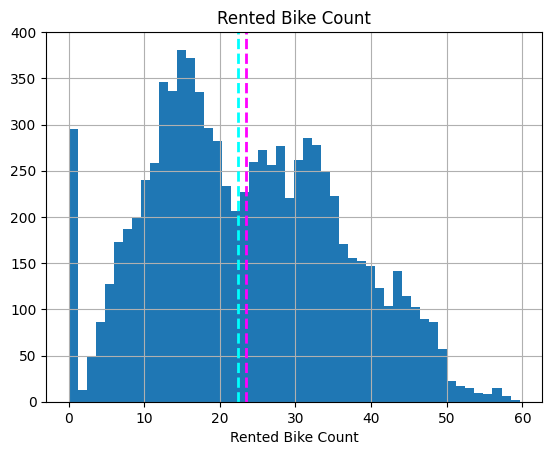

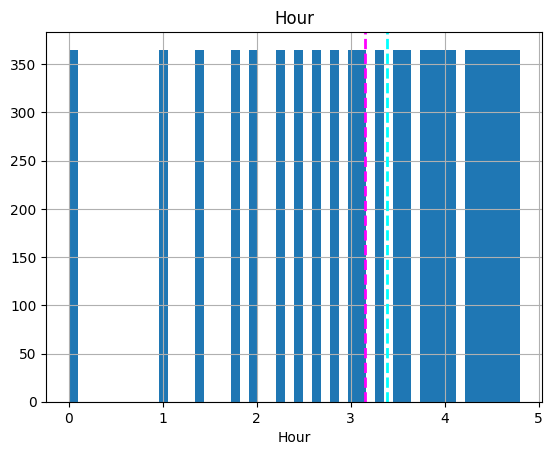

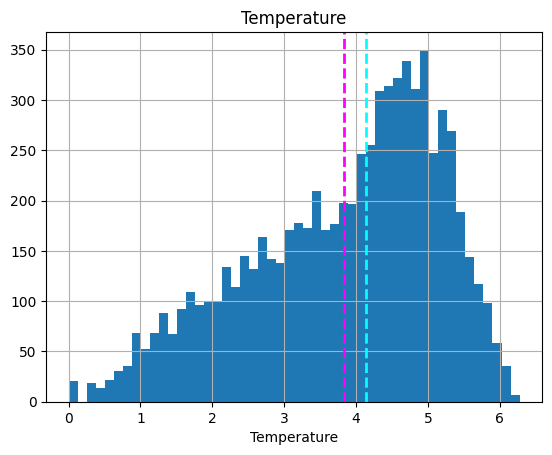

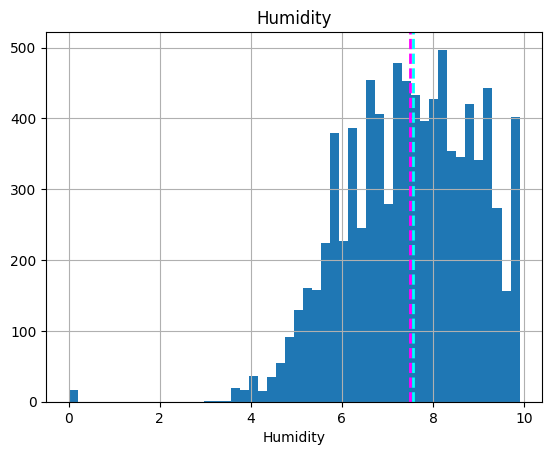

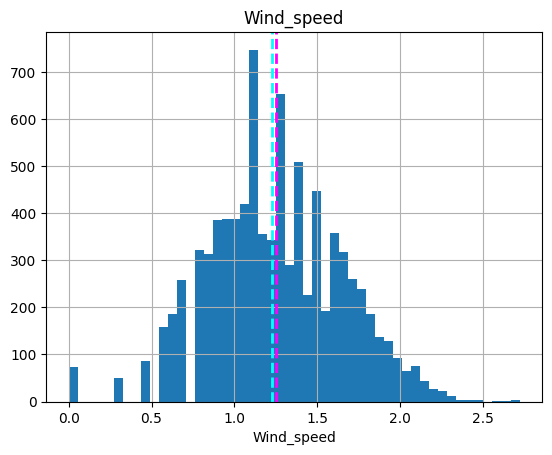

...

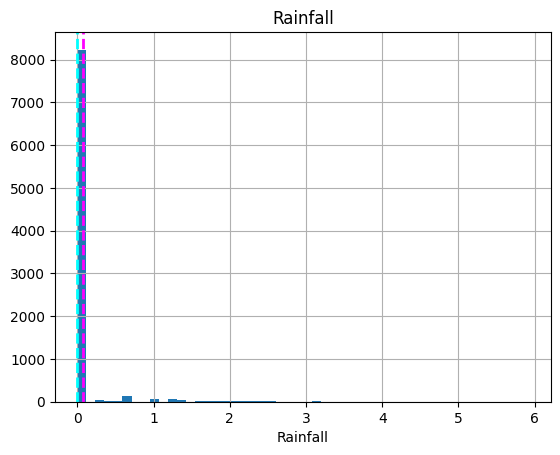

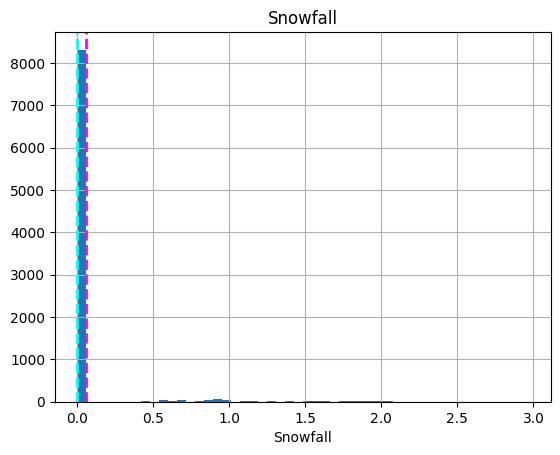

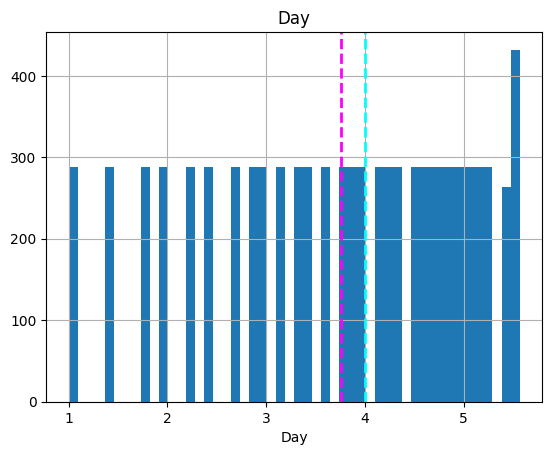

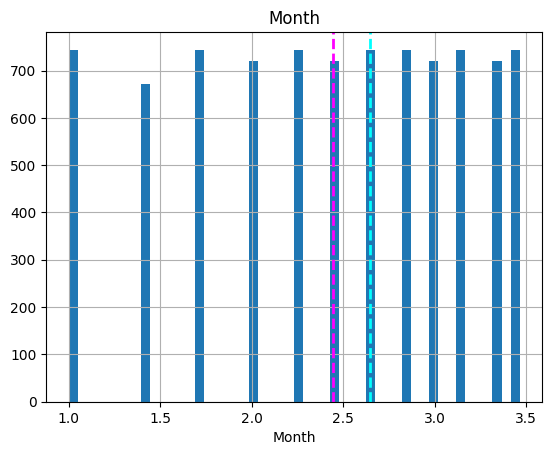

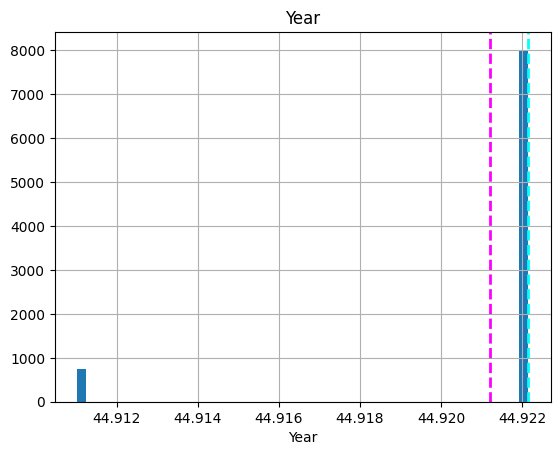

In [ ]:
# Normalizing The variables using squre root method.
for i in num_vars:
    feature = np.sqrt(df[i])
    feature.hist(bins=50)
    plt.axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2)
    plt.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    plt.title(i)
    plt.xlabel(i)
    plt.show()

In [ ]:
df.head(2)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,weekday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017


# Both chart 1 & chart 2 are for numeric variable analysis.(univariate analysis)
#   1-Histogram
#   2-Boxplot
# chart 3 & chart 4 will be for catagorical variable(univriate analysis)
#   1-Barchart
#   2-Piechart

#### Chart - 3

In [ ]:
# Chart - 3 visualization code
# Bar chart
cat_cols = list(df.select_dtypes(include=['object']))
cat_cols

['Seasons', 'Holiday', 'Functioning_Day', 'weekday']

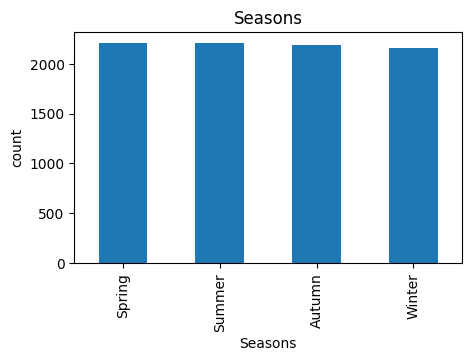

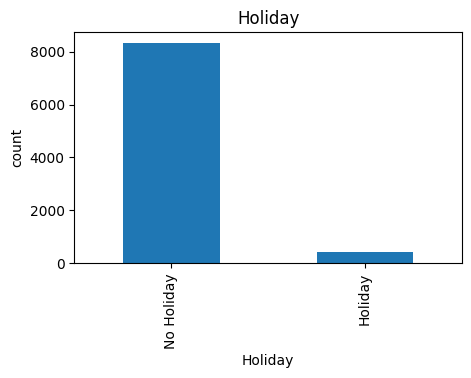

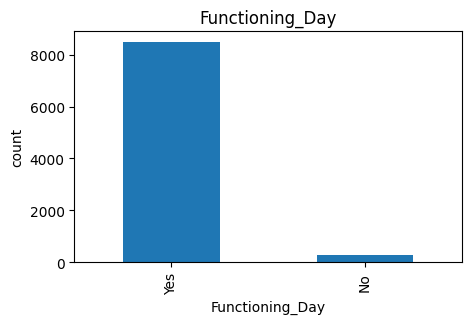

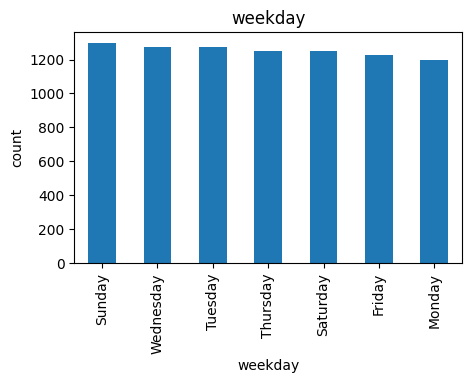

In [ ]:
for i in cat_cols:
  plt.figure(figsize=(5,3))
  df[i].value_counts().plot(kind='bar')
  plt.xlabel(i)
  plt.ylabel('count')
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Bar charts make it easy to compare different categories or groups of data. You can quickly see which category has the highest or lowest value.
bar charts are a versatile and widely used tool for data visualization, particularly when dealing with categorical or discrete data. They provide a clear visual representation of data, making it easier to draw insights and make informed decisions.

##### 2. What is/are the insight(s) found from the chart?

No holiday,function day, summer is having maximum counts.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

as these above variables are high , we'll see how these will react with rented_bike_count on bivariate analysis.

#### Chart - 4

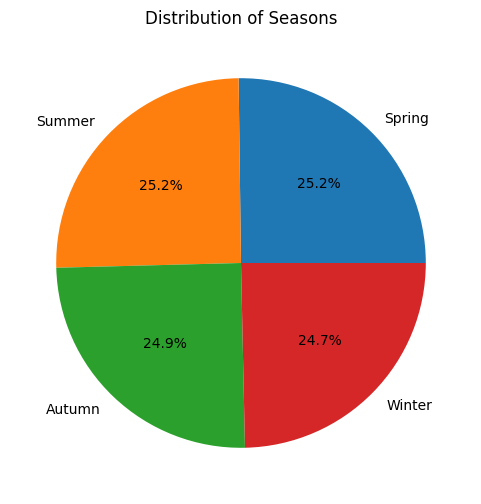

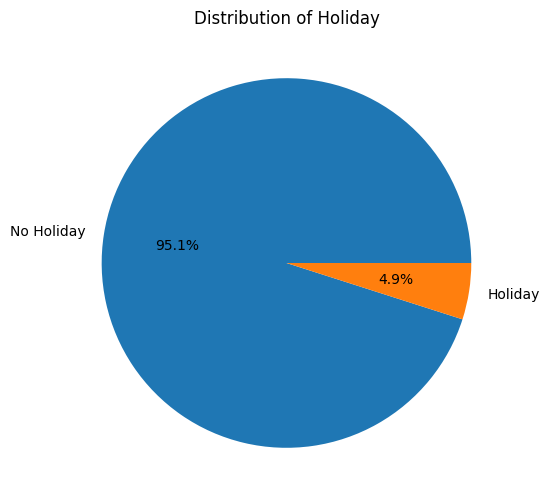

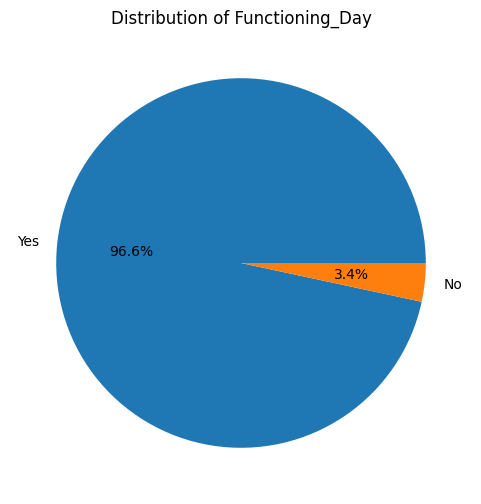

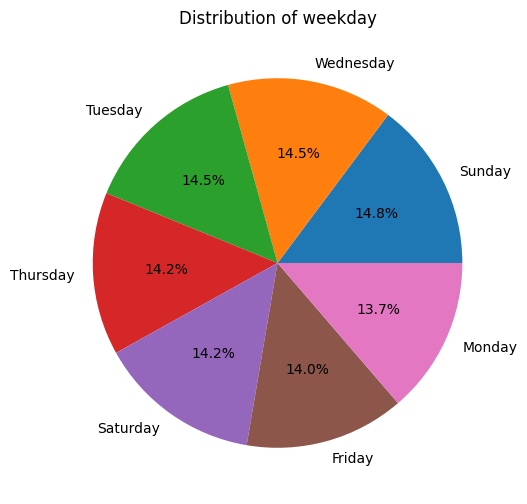

In [ ]:
# Chart - 4 visualization code
# piechart
for i in cat_cols:
    plt.figure(figsize=(6, 6))
    df[i].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Distribution of {i}')
    plt.ylabel('')
    plt.show()

##### 1. Why did you pick the specific chart?

Pie charts are a type of data visualization used to represent categorical data as a circular graph. They are useful for visualizing the distribution of categories or proportions of a whole.
Each slice of the pie represents a category, and the whole pie represents 100% of the data.
Pie charts are simple to understand and visually appealing. They work well when you have a small number of categories.

##### 2. What is/are the insight(s) found from the chart?

Distribution of catagorical variables showing above in chart.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

From the annotation we can clearly see which are the variables which are high in count and we can consider these in further for analysis.

#### Chart - 5

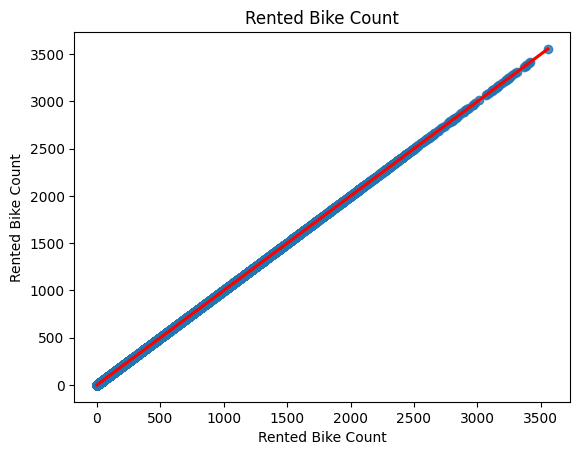

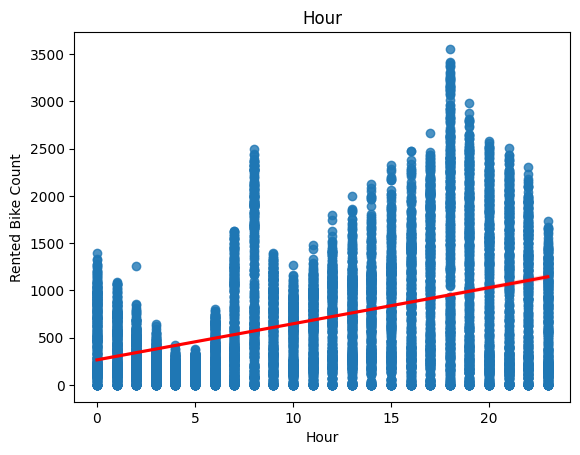

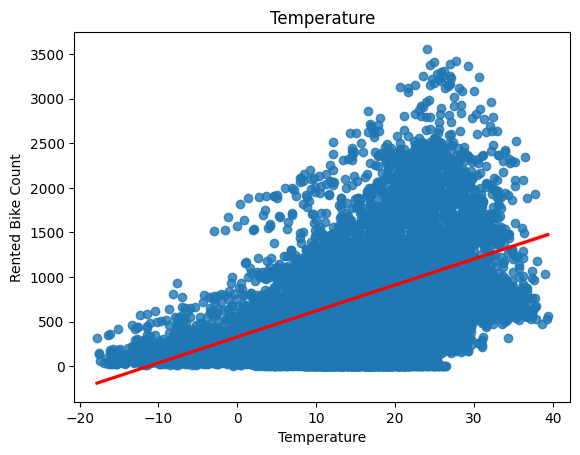

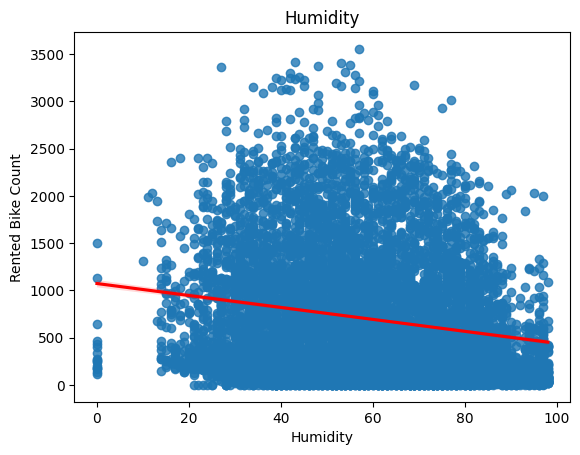

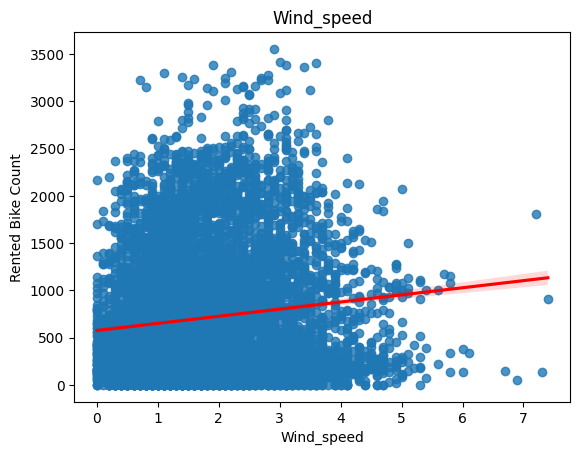

...

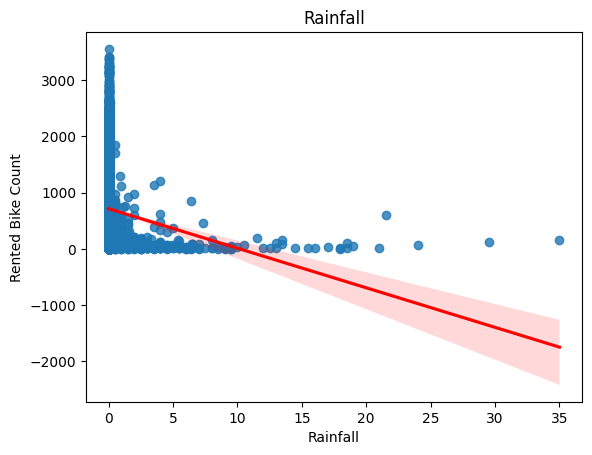

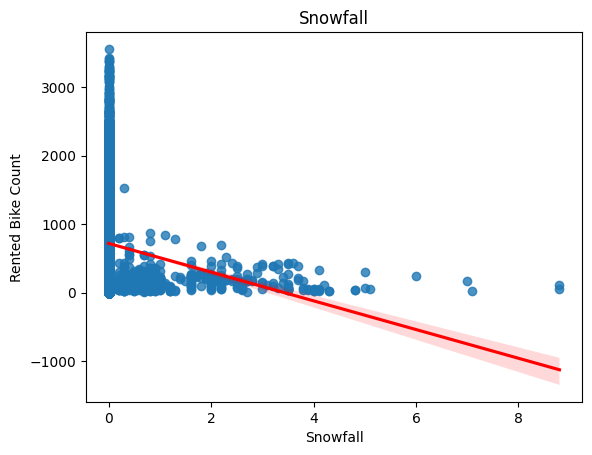

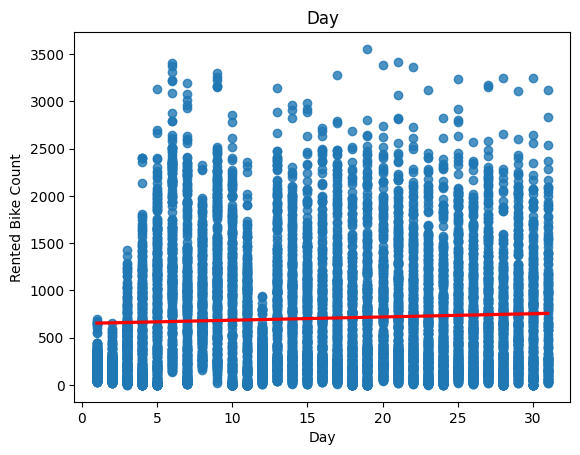

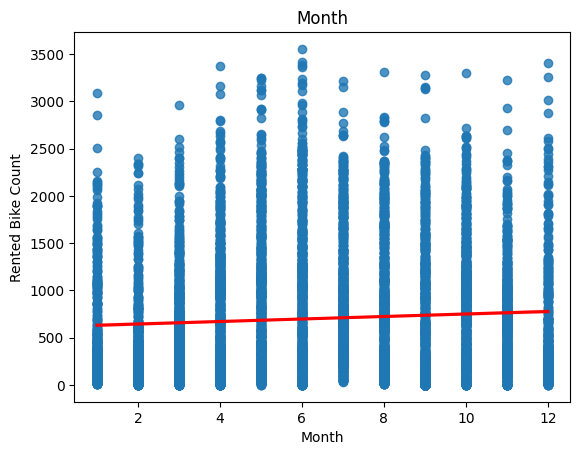

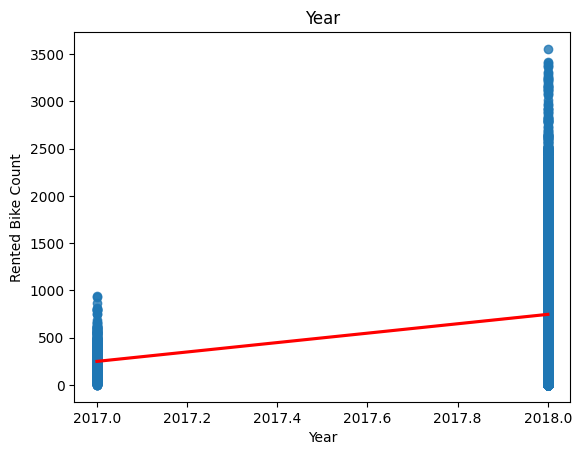

In [ ]:
# Chart - 5 visualization code
# Bivariate analysis(numeric vs numeric)
# Regression plot
for i in num_vars:
  #plt.scatter(x= df[i], y=df['Rented Bike Count'])
  sns.regplot(x = df[i], y = df['Rented Bike Count'],line_kws = {"color": "red"})
  plt.title(i)
  plt.xlabel(i)
  plt.show()

##### 1. Why did you pick the specific chart?

In a regression plot, you typically have a scatter plot of the data points, similar to a regular scatter plot. However, regression plots also include a fitted regression line (a straight line or curve) that represents the best-fit relationship between the variables. This line is determined by a regression algorithm.

##### 2. What is/are the insight(s) found from the chart?

This regression plots shows that some of our features are positive linear and some are negative linear in relation to our target variable.


**Hour:**
1)There is sudden peak between 6/7AM to 10 AM. Office time,College and going time could be the reason for this sudden peak.

2) Again there is peak between 10 AM to 7 PM. may be its office leaving time for the above people.

3) We can say that,from morning 7 AM to Evening 7 PM we have good Bike Rent Count. and from 7 PM to 7 AM Bike Rent count starts declining.

**Temperature:**
1) For decrease in temperature below 0 deg celicus the bike rent count is significantly decreased because may be people dont want to ride bike in such cold temperature.

2) But for normal temperature the Bike rent count is very high.

**humidity**
1) Here its seems like humidty is inversely proportional to bike rent count. As humdity percentage is increasing there is decrease in bike rent count.

**Wind Speed:**
1) upto wind speed 4 m/s there is good bike rent count.

**Visibility**
1) It's very obivious that as visibilty increases the bike rent count also increases. Nobody would prefere to ride in low visibilty.

**Dew Point Temperature**
1)It's again the same case as of temperature. As dew temperature goes below 0 deg celcius there is less bike rent count. It looks like Dew Point temperature and Temperature columns have strong colinarity.

**Solar radiation**
1)Here the amount of rented bikes is huge, when there is solar radiation.

**Rainfall And snowfall**
1) Its very obivious that people usually do not like ride bikes in rain and snowfall.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

we can check linearity with dependent and independent variables.

# scatterplot and regressionplot are kind of same but with regression plot bestfitlines are showing.

#### Chart - 6

<Figure size 3000x2500 with 0 Axes>

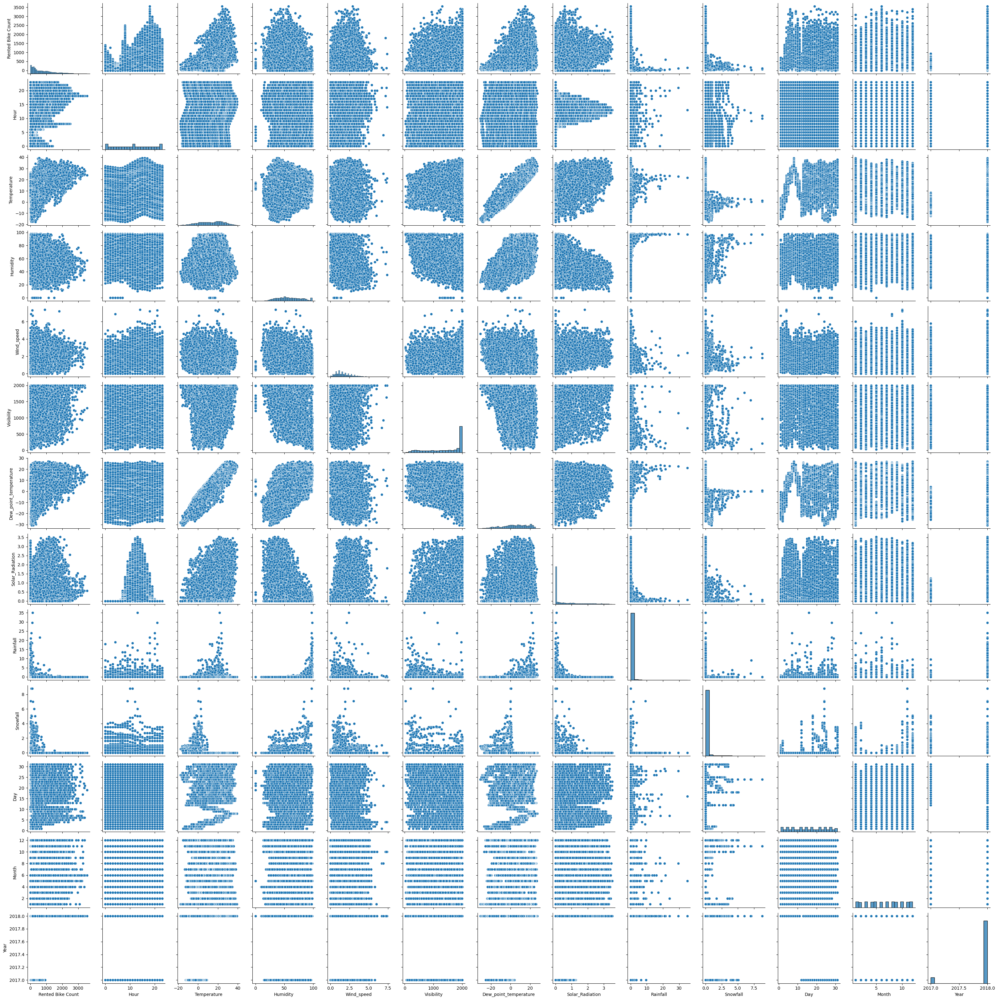

<Figure size 3000x2500 with 0 Axes>

In [ ]:
# Chart - 6 visualization code
# jointplot/pairplot

sns.pairplot(df)
plt.figure(figsize=(30,25))

##### 1. Why did you pick the specific chart?

pairplot is a type of data visualization that is particularly useful when dealing with datasets that contain multiple numerical features (variables). It provides a grid of scatterplots for each pair of numerical variables in your dataset, allowing you to visualize the relationships and correlations between them. Here are some reasons why you might want to use a pairplot:

**Identify Patterns:** Pairplots help you quickly identify any visible patterns or trends in your data. You can visually detect relationships such as linear, nonlinear, or clustering patterns between pairs of variables.

**Correlation Analysis:** You can use pairplots to assess the degree and direction of correlation between variables. If two variables show a linear relationship, you'll see a trend or a line in the scatterplot.

**Outlier Detection:** Outliers, which are data points that significantly deviate from the majority of the data, can be spotted easily in pairplots. These outliers may warrant further investigation or data preprocessing.

**Feature Selection:** When you have many variables, pairplots can help you decide which variables might be worth exploring further in your analysis. You can look for relationships between features and the target variable.

**Data Exploration:** Pairplots are a useful exploratory data analysis (EDA) tool. They allow you to get a sense of the data distribution and relationships before building more complex models.

**Multivariate Analysis:** While scatterplots show relationships between two variables at a time, pairplots extend this analysis to multiple variables simultaneously. This can be particularly valuable when dealing with high-dimensional data.

**Diagnostic Tool:** Pairplots can be used as a diagnostic tool to identify potential issues such as heteroscedasticity, nonlinearity, or interaction effects between variables.

**Communication:** When presenting your findings or insights from a dataset, pairplots can be a helpful visualization to convey complex relationships in a simple and interpretable manner.

##### 2. What is/are the insight(s) found from the chart?

We have to find on which time our demand for bike rent is increasing. from the chart we get that,
- Snowfall & Rainfall are highly corelated to each other, so in future at time of model training we'll use only one .because if we'll use both then we'll give more data to train the model it will take extra times.
As both are giving same information so we can use one from both.
- Rented bike count are right skewed.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 -  When we'll see hour column with our dependent variable , there are some hours on which the demand of our bikes are high. so on that company can increase the price, so it can give good impact in business.
 -  also at the time when demand are low in month or day or hour company can give their bike for service.

#### Chart - 7

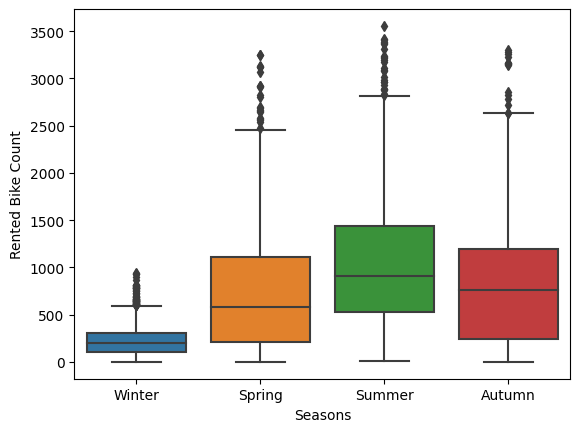

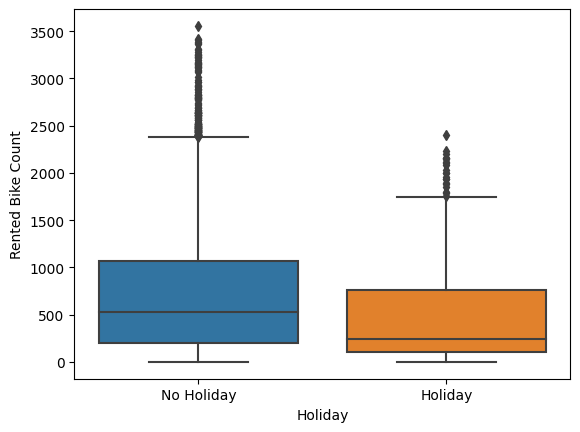

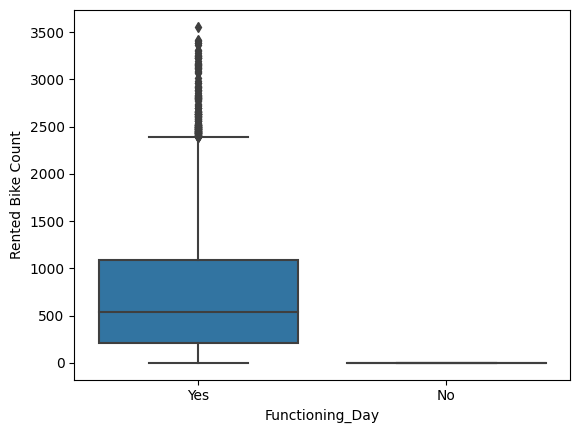

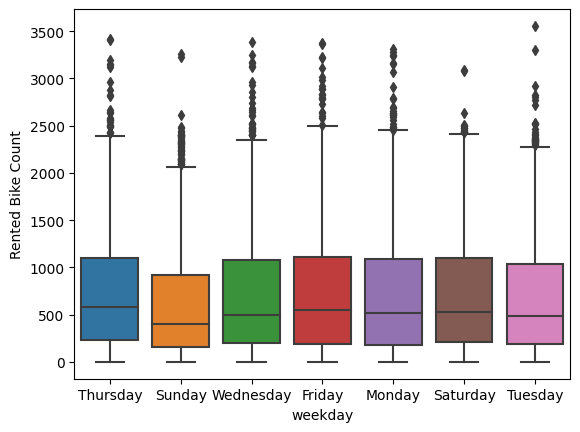

In [ ]:
# Chart - 7 visualization code
# Box plot (Bivariate, numeric vs categorical)
for i in cat_cols:
  sns.boxplot(x=df[i],y = df['Rented Bike Count'])
  plt.show()

##### 1. Why did you pick the specific chart?

A boxplot displays the median (the middle value), quartiles (25th and 75th percentiles), and potential outliers. This summary provides a quick understanding of the data's central tendency and spread.

Outliers are data points that significantly deviate from the bulk of the data. Boxplots explicitly show potential outliers as individual points outside the "whiskers" or the interquartile range (IQR). Outliers can be critical in data analysis, as they may indicate errors or interesting phenomena.

 A long tail on one side of the box indicates skewness in that direction.

 The length of the box (the IQR) represents the spread or variability of the data. A longer box indicates greater variability.

##### 2. What is/are the insight(s) found from the chart?

1) Summer season had the higest Bike Rent Count. People are more likely to rent bikes in summer. Bike rentals in winter is very less compared to other seasons.

2) High number of bikes were rented on No Holidays.

3) On no functioning day no bikes were rented. we have only 295 counts of "NO". Thus we can drop that 295 values but column having only "Yes' will not add value to our column.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

no function column will not give any value,So these columns is not use full for us. We will drop those in next steps.


#### Chart - 8

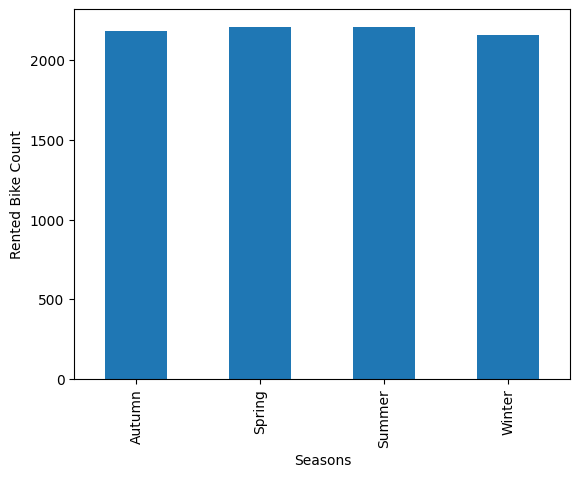

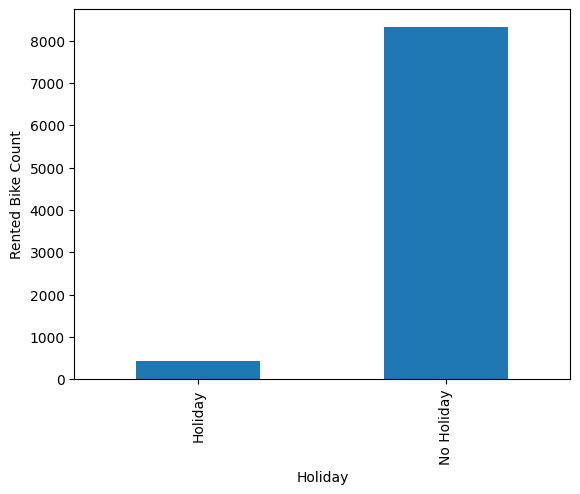

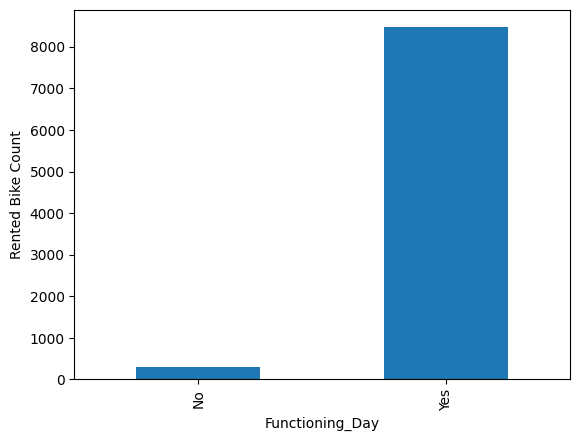

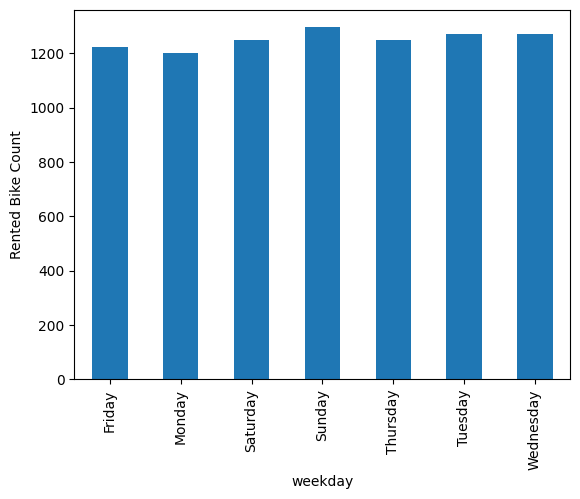

In [ ]:
# Chart - 8 visualization code
# Bar chart
for i in cat_cols:
    df.groupby(i)['Rented Bike Count'].size().plot(kind='bar')
    plt.xlabel(i)
    plt.ylabel('Rented Bike Count')
    plt.show()

##### 1. Why did you pick the specific chart?

Bar plots are excellent for comparing different categories or groups. They make it easy to see and understand the differences in values among these categories.
 Bar plots are easy to read and interpret, even for individuals who are not familiar with data visualization techniques. They provide a clear and straightforward representation of data.

##### 2. What is/are the insight(s) found from the chart?

in function day rented bike count are high.

in summer & spring season count are high.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

From above chart company can give more importance on summer ,functions day.

#### Chart - 9

Text(0.5, 1.0, 'Bike Rental Trend according to Hour on Holiday / No Holiday')

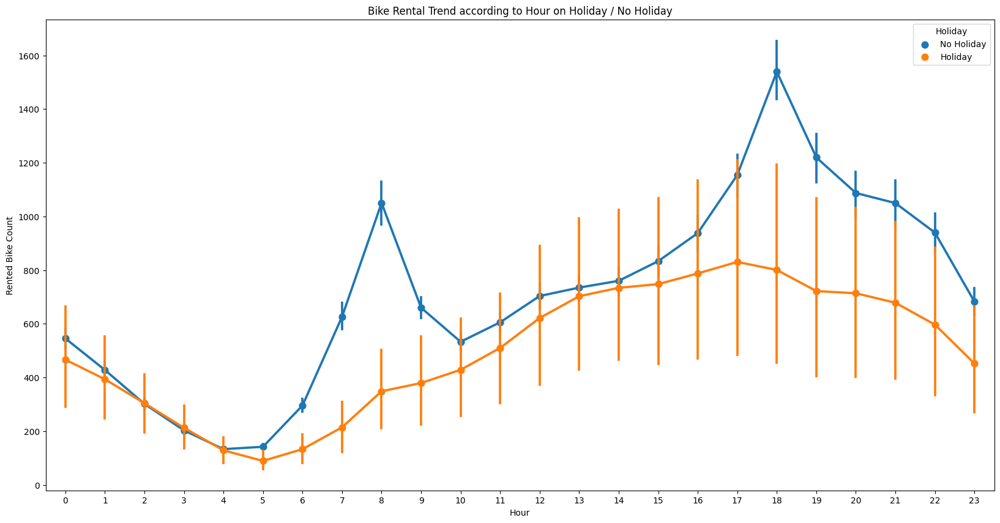

In [ ]:
# Chart - 9 visualization code
# Bike Rental trend with respect to Hour on Holiday or No Holiday.
plt.figure(figsize=(20,10))
sns.pointplot(x=df['Hour'],y=df['Rented Bike Count'],hue=df['Holiday'])
plt.title("Bike Rental Trend according to Hour on Holiday / No Holiday")


##### 1. Why did you pick the specific chart?

Point plots are used to display trends, patterns, or relationships in data. They are particularly effective when you want to emphasize variations in data across different categories or levels of an independent variable.

They provide a clear visual representation of how the central tendency (e.g., mean, median) of the data varies across categories.

##### 2. What is/are the insight(s) found from the chart?

1) There is sudden peak between 6/7AM to 10 AM. Office time,College and going time could be the reason for this sudden peak.( NO Holiday). But on Holiday the case is different less bike rentals happend.

2) Again there is peak between 10 AM to 7 PM. may be its office leaving time for the above people.( NO Holiday).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

- office,school timing are for good business time.

#### Chart - 10

Text(0.5, 1.0, 'Distribution of rental bike count on functioning day wrt hour')

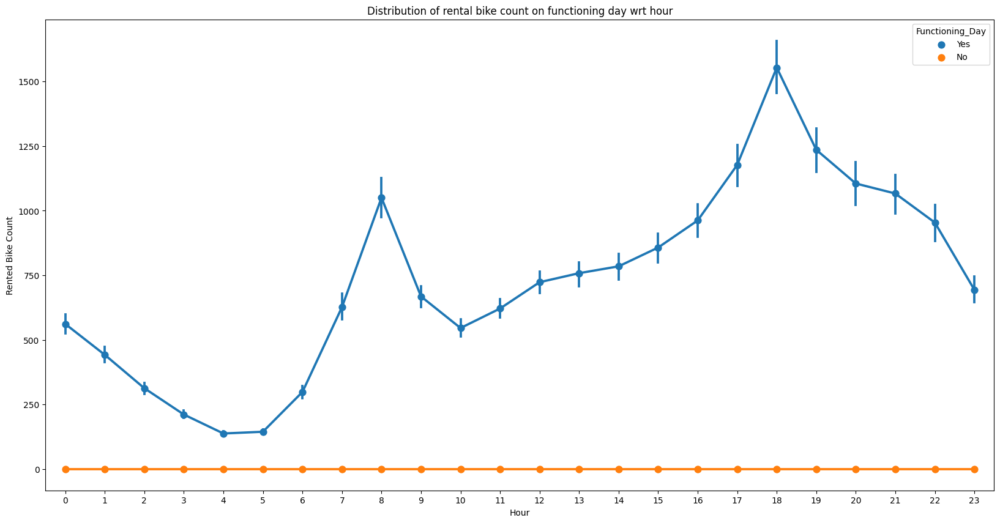

In [ ]:
# Chart - 10 visualization code
## Bike Rental trend with respect to Hour on Functioning day.
plt.figure(figsize=(20,10))
sns.pointplot(x = df['Hour'], y=df['Rented Bike Count'], hue=df['Functioning_Day'])
plt.title('Distribution of rental bike count on functioning day wrt hour')

##### 1. Why did you pick the specific chart?

Point plots are used to display trends, patterns, or relationships in data. They are particularly effective when you want to emphasize variations in data across different categories or levels of an independent variable.

They provide a clear visual representation of how the central tendency (e.g., mean, median) of the data varies across categories.

##### 2. What is/are the insight(s) found from the chart?

1) Here the trend for functioning day is same as of No holiday. Only the difference is on No functioning day there is no bike rentals.

*(if we drop no fucntioning day rows. we will left only with the functioning day values.thus the column having same value through out will not be helpful.*
*So,its better to drop the column.)*

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This will not create any business need as we will train that with model.

#### Chart - 11

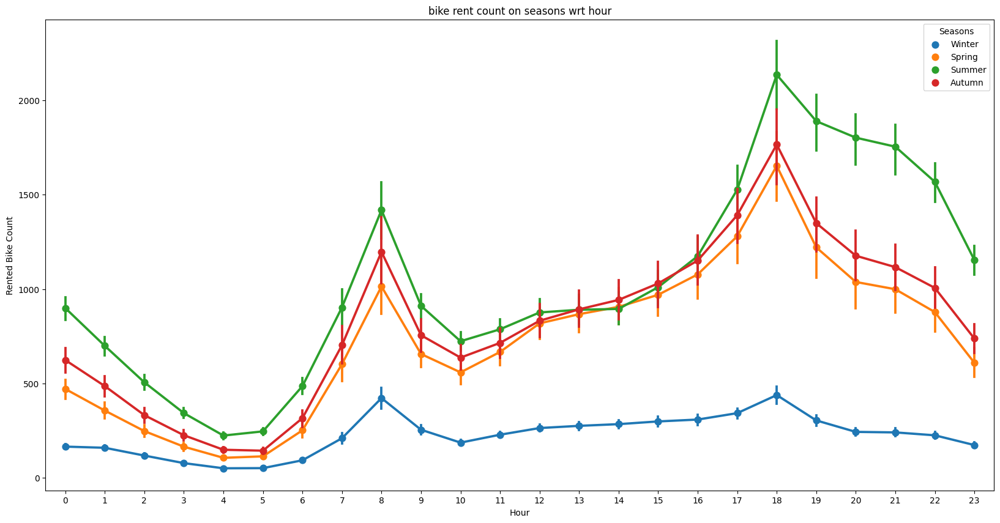

In [ ]:
# Chart - 11 visualization code
# Bike Rent Count trend with respect Hours on Seasons.
plt.figure(figsize=(20,10))
sns.pointplot(x=df['Hour'],y=df['Rented Bike Count'],hue=df['Seasons'])
plt.title('bike rent count on seasons wrt hour')
plt.show()

##### 1. Why did you pick the specific chart?

point plots are valuable for highlighting patterns, differences, and relationships in data, especially when comparing means or averages across categorical variables. They are a versatile tool in the data analyst's toolbox for exploring and communicating data insights effectively.

Point plots often include error bars that represent confidence intervals or standard errors around the central values. These error bars provide information about the uncertainty associated with each point estimate, enhancing the viewer's understanding of the data.

##### 2. What is/are the insight(s) found from the chart?

On winter bike rents are low.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

on summer more bike should make available.

#### Chart - 12

<Axes: xlabel='Rented Bike Count'>

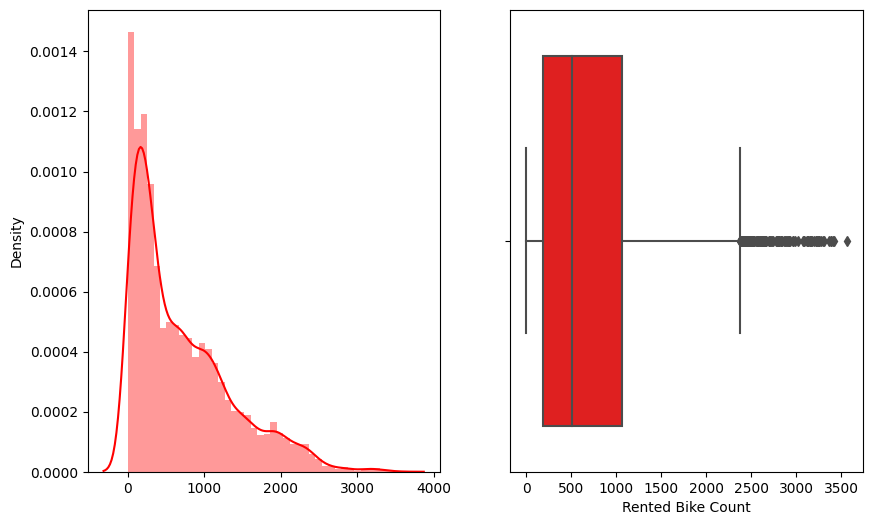

In [ ]:
# Chart - 12 visualization code
# Let's check distribution of target variable- "Bike Rented Count"
f, axes = plt.subplots(1,2,figsize=(10,6))
sns.distplot(x=df['Rented Bike Count'],color='r',ax=axes[0])
sns.boxplot(x=df['Rented Bike Count'],color='r',ax=axes[1])

##### 1. Why did you pick the specific chart?

These two we have used just to check the distribution of dependent variable and it's skewness.

##### 2. What is/are the insight(s) found from the chart?

We got to know from the two chart these are rightly skewed.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

we will see that these are skewed ,to normalize them we'll use square root method.

#### Chart - 13

<Axes: xlabel='Rented Bike Count'>

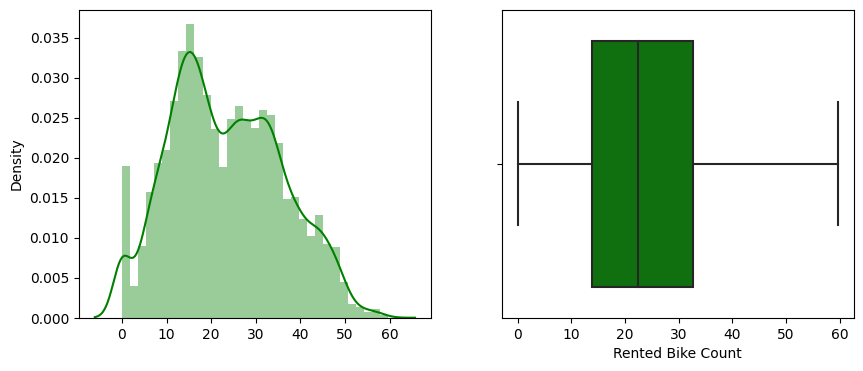

In [ ]:
# Chart - 13 visualization code
# Normalizing  our target variable by squre root method
f,axes = plt.subplots(1,2,figsize=(10,4))
sns.distplot(x=np.sqrt(df['Rented Bike Count']),color='g',ax=axes[0])
sns.boxplot(x=np.sqrt(df['Rented Bike Count']),color='g',ax=axes[1])

##### 1. Why did you pick the specific chart?

we have done distplot chart & boxplot chart to check for skewness.

##### 2. What is/are the insight(s) found from the chart?

on above we have done square root normalization ,after that there is changes in figure as before it was right skewed but now it is not showing skewed & no outliers present.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

having outlier would have created problem in model training , after normalization outlier were not present hence it will give good impact on training.

#### Chart - 14 - Correlation Heatmap

<Axes: >

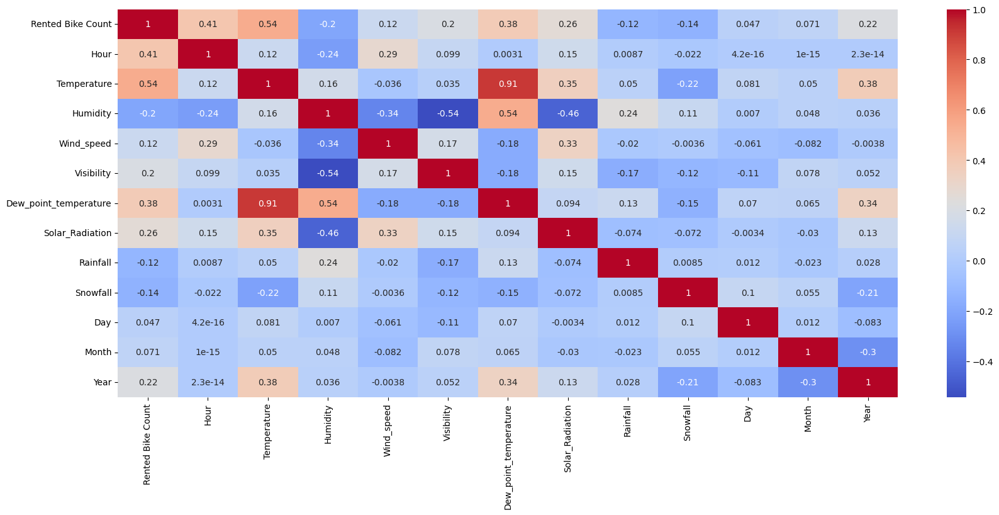

In [ ]:
# Correlation Heatmap visualization code
# Checking Corelation between dependent and independent variable
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')


##### 1. Why did you pick the specific chart?

It is particularly useful for visualizing complex datasets, especially when you want to explore relationships between variables or patterns within the data. Heatmaps are excellent for visualizing relationships or correlations between variables in a dataset. By assigning colors to different values, you can quickly identify which variables are positively or negatively correlated.
Unusual or outlier values can stand out in a heatmap

##### 2. What is/are the insight(s) found from the chart?

- Temperature and Dew point Temperature are highly correlated.
As per our regression assumption, there should not be colinearity between independent variables.

- We can see from the heatmap that "Temperature" and "Dew Point Temperature" are highly corelated. We can drop one of them.As the corelation between temperature and our dependent variable "Bike Rented Count" is high. So we will Keep the Temperature column and drop the "Dew Point Temperature" column.

- And also we dropping "Date" column as its not useful for us(as we have created the month, day and year columns.

#### Chart - 15 - Pair Plot

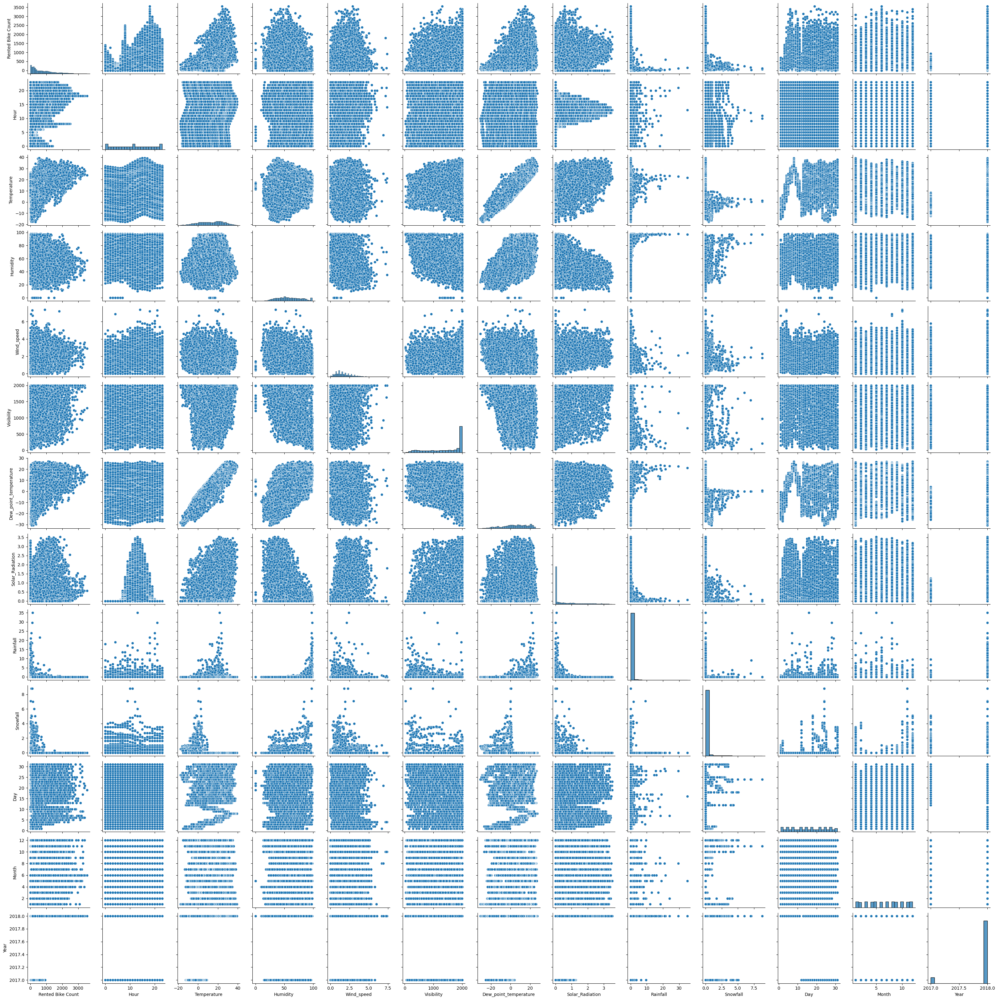

In [ ]:
# Pair Plot visualization code
sns.pairplot(df)

##### 1. Why did you pick the specific chart?

pairplot is a type of data visualization that is particularly useful when dealing with datasets that contain multiple numerical features (variables). It provides a grid of scatterplots for each pair of numerical variables in your dataset, allowing you to visualize the relationships and correlations between them.

##### 2. What is/are the insight(s) found from the chart?

We have to find on which time our demand for bike rent is increasing. from the chart we get that,

Snowfall & Rainfall are highly corelated to each other, so in future at time of model training we'll use only one .because if we'll use both then we'll give more data to train the model it will take extra times. As both are giving same information so we can use one from both.
Rented bike count are right skewed.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

**Hypothesis Statement 1:**
Statement: The average number of bike rentals on function day is higher than non-function day.

Null Hypothesis (H0): μ_function ≤ μ_nonfunction

Alternative Hypothesis (H1): μ_function > μ_nonfunction

**Hypothesis Statement 2:**
Statement: There is no significant difference in the average number of bike rentals during different weather conditions (clear vs. not clear).

Null Hypothesis (H0): μ_clear = μ_not_clear

Alternative Hypothesis (H1): μ_clear ≠ μ_not_clear

**Hypothesis Statement 3:**
Statement: Bike rentals on holidays and non-holidays have the same average demand.

Null Hypothesis (H0): μ_holiday = μ_non_holiday

Alternative Hypothesis (H1): μ_holiday ≠ μ_non_holiday

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Statement:** The average number of bike rentals on function day is higher than non-function day.

**Null Hypothesis (H0):**
The null hypothesis assumes that there is no significant difference in the average number of bike rentals between function and nonfunction. It states that the average number of rentals on function (μ_function) is less than or equal to the average number of rentals on nonfunction (μ_nonfunction).

**Alternative Hypothesis (H1):**
The alternative hypothesis suggests that there is a significant difference in the average number of bike rentals between function and nonfunction. It specifically states that the average number of rentals on function (μ_function) is greater than the average number of rentals on nonfunction (μ_nonfunction).

**In statistical terms:**

H0: μ_function ≤ μ_nonfunction
H1: μ_function > μ_nonfunction
The goal of the hypothesis test is to determine whether there is enough evidence to reject the null hypothesis in favor of the alternative hypothesis based on the sample data.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value


In [ ]:
df.head(2)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,weekday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017


In [ ]:
# Hypothesis Test 1 - T-test
Functioning_Day_rentals = df[df['Functioning_Day'] == 'Yes']['Rented Bike Count']
Non_Functioning_Day_rentals = df[df['Functioning_Day'] == 'No']['Rented Bike Count']
t_statistic1, p_value1 = stats.ttest_ind(Functioning_Day_rentals, Non_Functioning_Day_rentals, alternative='greater')

In [ ]:
print("Hypothesis Test 1 (Functioning_Day vs. Non_Functioning_Day): p-value (T-test) =", p_value1)

Hypothesis Test 1 (Functioning_Day vs. Non_Functioning_Day): p-value (T-test) = 3.366105287750711e-83


The p-value of 3.366e-83, or 3.366105287750711e-83 in scientific notation, is an extremely small value. In hypothesis testing, the p-value is used to determine the significance of your results.

Here's what this p-value means in the context of Hypothesis Test 1 (Functioning_Day vs. Non_Functioning_Day):

**Null Hypothesis (H0):** There is no significant difference in bike demand between Functioning Days and Non-Functioning Days.

**Alternative Hypothesis (Ha):** There is a significant difference in bike demand between Functioning Days and Non-Functioning Days.

When you perform a t-test and obtain a p-value as small as 3.366e-83, it indicates an extremely high level of statistical significance. This means that the data provides very strong evidence against the null hypothesis. In other words, you can conclude that there is indeed a significant difference in bike demand between Functioning Days and Non-Functioning Days.

In practical terms, this result suggests that the day of the week (Functioning vs. Non-Functioning) has a statistically significant impact on bike demand, and you should reject the null hypothesis in favor of the alternative hypothesis.

##### Which statistical test have you done to obtain P-Value?

The statistical test that was performed to obtain the p-value in Hypothesis Test 1 (Functioning_Day vs. Non_Functioning_Day) is a t-test.

##### Why did you choose the specific statistical test?

The specific statistical test, a t-test, was chosen because it is appropriate for comparing the means of two groups to determine if they are significantly different from each other.

In Hypothesis Test 1, the goal was to compare the average bike demand on functioning days (Functioning_Day == Yes) and non-functioning days (Functioning_Day == No) to see if there was a statistically significant difference in bike demand between these two groups.

The t-test is a commonly used test for such comparisons, and it helps determine if the observed differences in means are statistically significant or if they could have occurred due to random chance.

The resulting low p-value (p < 0.05) suggests that there is strong evidence to reject the null hypothesis and conclude that there is a significant difference in bike demand between functioning and non-functioning days.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Hypothesis 2 (Temperature Impact on Bike Demand):

**Null Hypothesis (H0):** The average bike demand on days with high temperatures (above a certain threshold) is equal to the average bike demand on days with low temperatures (below or equal to the threshold).

**Alternate Hypothesis (Ha):** The average bike demand on days with high temperatures (above a certain threshold) is not equal to the average bike demand on days with low temperatures (below or equal to the threshold).

In other words, the null hypothesis assumes that temperature has no significant impact on bike demand, while the alternate hypothesis suggests that there is a significant difference in bike demand between days with high and low temperatures.

#### 2. Perform an appropriate statistical test.

In [ ]:
df.head(2)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,weekday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017


In [ ]:
# Perform Statistical Test to obtain P-Value
# Hypothesis Test 2 - Chi-square Test
weather_cross_tab = pd.crosstab(df['Seasons'], df['Rented Bike Count'])
chi2_stat2, p_value2, _, _ = stats.chi2_contingency(weather_cross_tab)

In [ ]:
print("Hypothesis Test 2 (Clear vs. Not Clear Weather): p-value (Chi-square test) =", p_value2)

Hypothesis Test 2 (Clear vs. Not Clear Weather): p-value (Chi-square test) = 1.703789312477651e-127


##### Which statistical test have you done to obtain P-Value?

I used the Chi-square test to obtain the p-value in Hypothesis Test 2 (Clear vs. Not Clear Weather).

##### Why did you choose the specific statistical test?

The Chi-square test was chosen for Hypothesis Test 2 (Clear vs. Not Clear Weather) because it's appropriate for analyzing the association between two categorical variables, such as "Clear" or "Not Clear" weather conditions. In this test, we are comparing the observed frequencies of these categorical variables against what would be expected if there were no association (null hypothesis).

The Chi-square test helps determine whether the observed distribution of data significantly differs from the expected distribution, and the resulting p-value indicates the strength of evidence against the null hypothesis. In this case, a very low p-value (1.703789312477651e-127) suggests a strong association between weather conditions and bike demand, indicating that "Clear" and "Not Clear" weather have significantly different effects on bike demand.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Bike rentals on holidays and non-holidays have the same average demand.

**Null Hypothesis (H0):** Bike rentals on holidays and non-holidays have the same average demand.

**Alternate Hypothesis (H1):** Bike rentals on holidays and non-holidays have different average demands.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Hypothesis Test 3 - ANOVA Test
# Split the data into two groups: Holiday and Non-Holiday
holiday_group = df[df['Holiday'] == 'Holiday']['Rented Bike Count']
non_holiday_group = df[df['Holiday'] == 'No Holiday']['Rented Bike Count']

# Perform ANOVA test
f_statistic, p_value3 = stats.f_oneway(holiday_group, non_holiday_group)

# Print the p-value
print(f'p-value (ANOVA) for Holiday vs. Non-Holiday: {p_value3}')

p-value (ANOVA) for Holiday vs. Non-Holiday: 1.2156443235104595e-11


##### Which statistical test have you done to obtain P-Value?

I have used ANOVA Test.

Why did you choose the specific statistical test?

The specific statistical test chosen for Hypothesis Test 3 (Bike rentals on holidays and non-holidays have the same average demand) is the Analysis of Variance (ANOVA) test. ANOVA is an appropriate choice for this hypothesis for the following reasons:

Comparison of Multiple Groups: ANOVA allows us to compare the means of more than two groups, making it suitable for comparing demand on multiple days of the week, such as holidays and non-holidays.

Numeric Data: ANOVA is used to compare means of numeric data across different groups. In this case, we are comparing the average demand (numeric data) across the two groups (holidays and non-holidays).

Assumption of Independence: ANOVA assumes that observations within each group are independent. In the context of bike rentals, it's reasonable to assume that the demand on one day is independent of the demand on another day.

Assumption of Homogeneity of Variances: ANOVA assumes that the variances within each group are approximately equal. This assumption is often met in practice when analyzing real-world data.

Hypothesis Testing: ANOVA allows us to test whether there are statistically significant differences in means across groups. In this case, we want to test if the mean demand on holidays is significantly different from the mean demand on non-holidays.

Overall, ANOVA is a suitable test for comparing means across multiple groups, making it a logical choice for examining whether there is a significant difference in average bike demand between holidays and non-holidays in the dataset.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
df.isnull().sum()

Rented Bike Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
weekday                  0
Day                      0
Month                    0
Year                     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

In our dataset as there is no null value so we don't need to do missing value imputation.

### 2. Handling Outliers

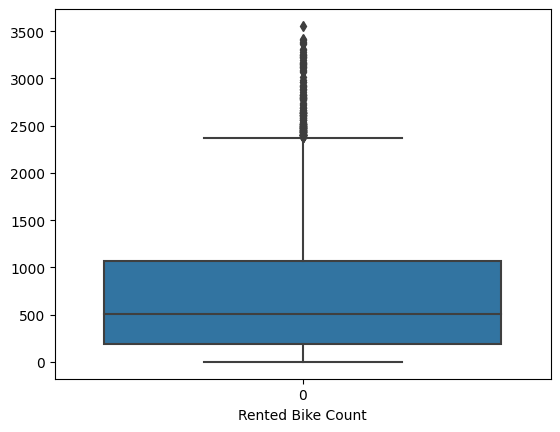

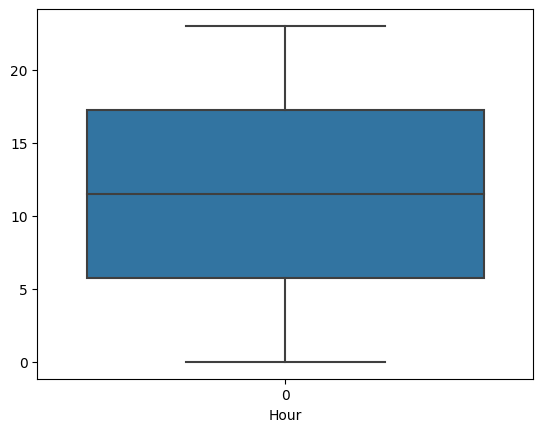

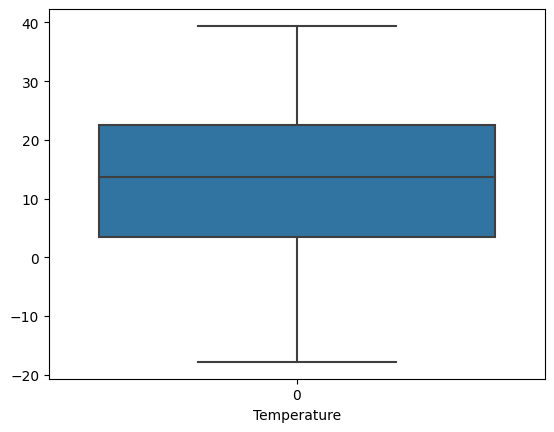

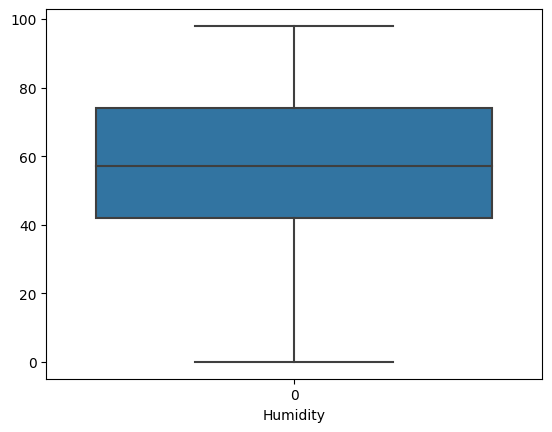

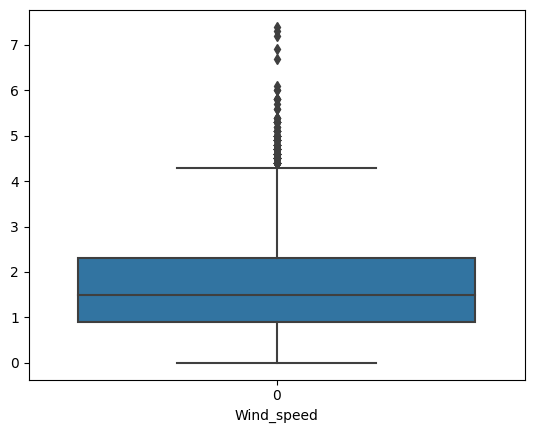

...

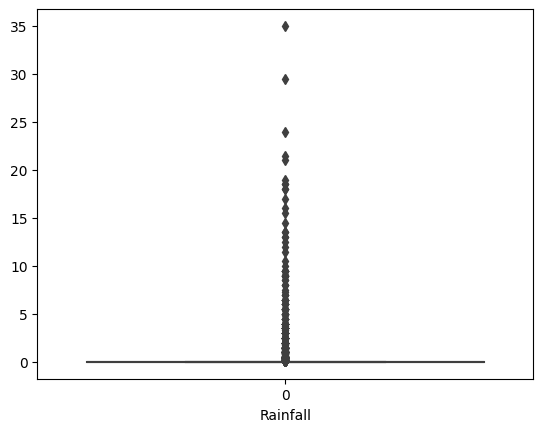

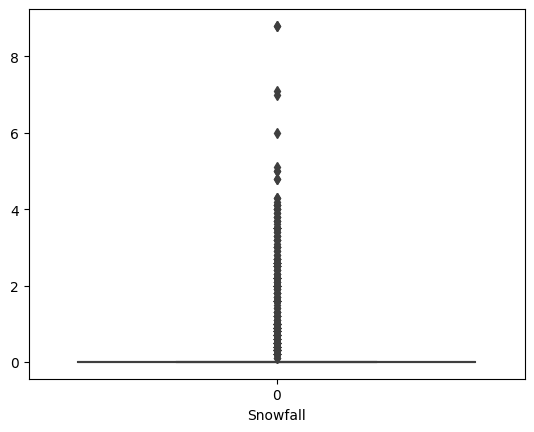

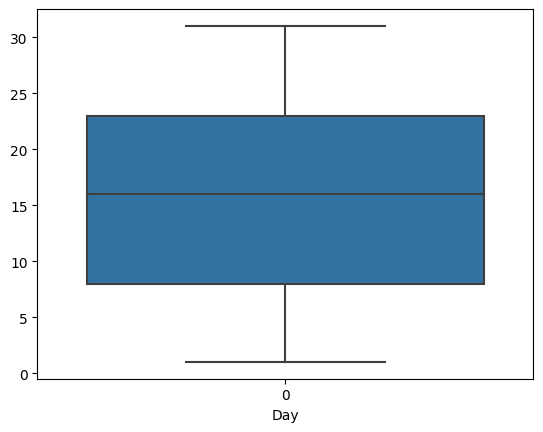

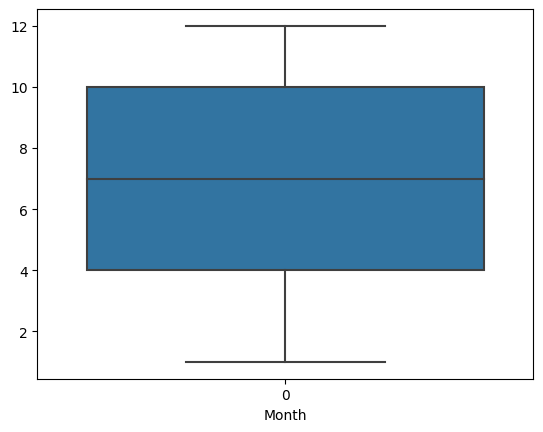

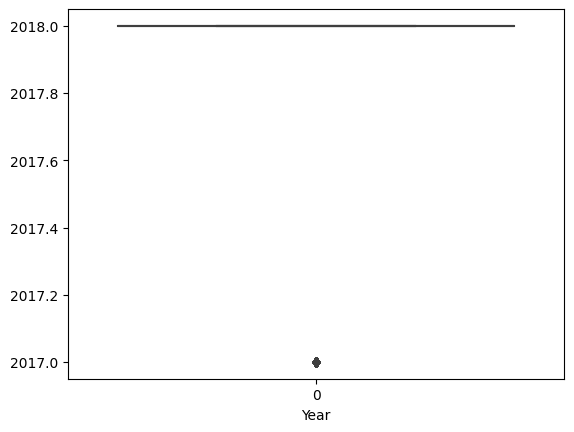

In [ ]:
# checking for outliers
for i in num_vars:
  sns.boxplot(df[i])
  plt.xlabel(i)
  plt.show()

Outliers are visible in the 'wind_speed', and 'solar_radiation' columns.

In [ ]:
df2 = df.copy()

In [ ]:
df2.head(2)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,weekday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017


In [ ]:
# Handling Outliers & Outlier treatments
# clipping method
def clip_outliers(df2):
  for i in df2[num_vars]:
    # using IQR method to define range of upper and lower limit.
    q1 = df2[i].quantile(0.25)
    q3 = df2[i].quantile(0.75)
    iqr = q3-q1
    lowerbound = q1-1.5*iqr
    upperbound = q3+1.5*iqr
    # replacing the outliers with upper and lower bound
    df2[i] = df2[i].clip(lowerbound,upperbound)
  return df2

In [ ]:
df2 = clip_outliers(df2)

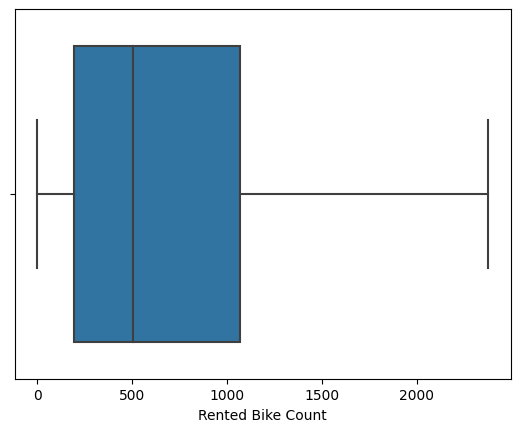

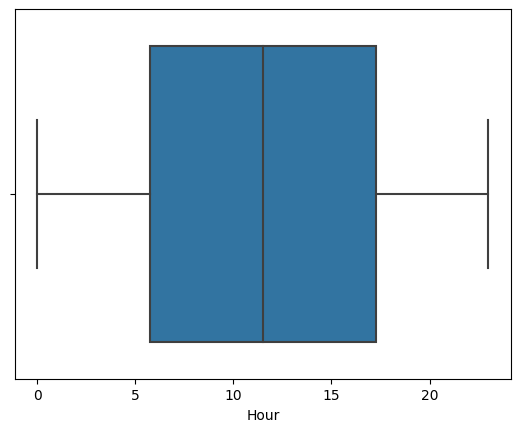

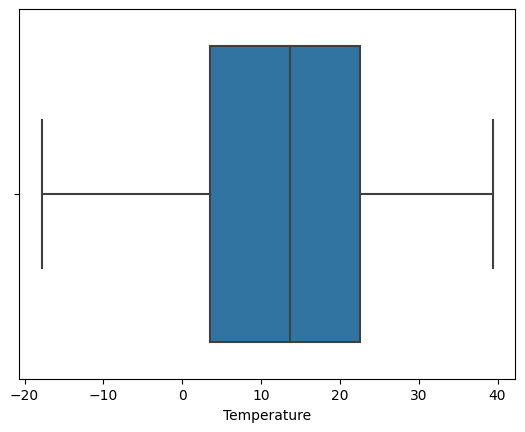

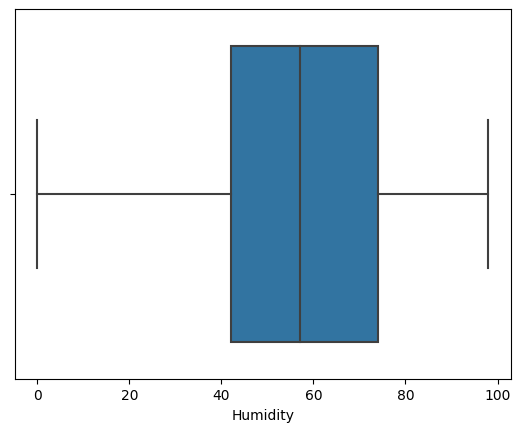

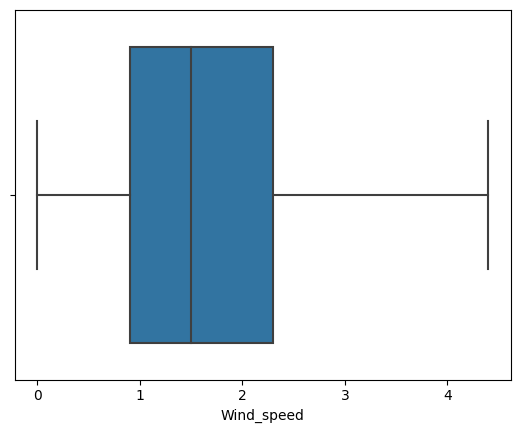

...

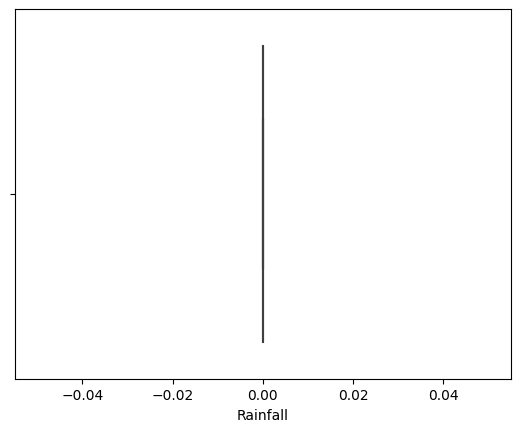

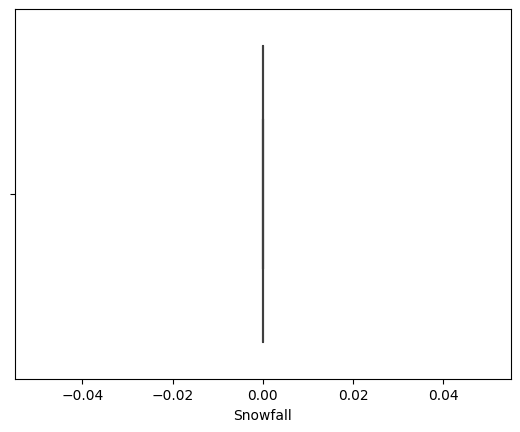

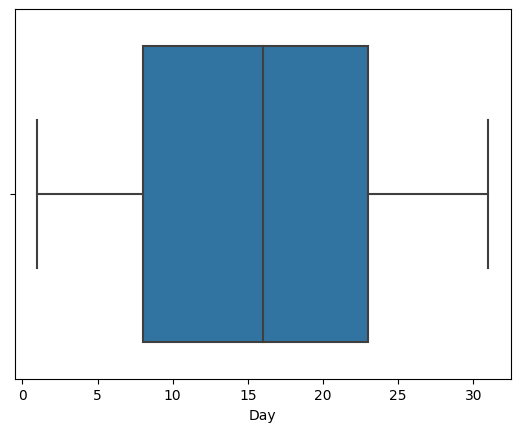

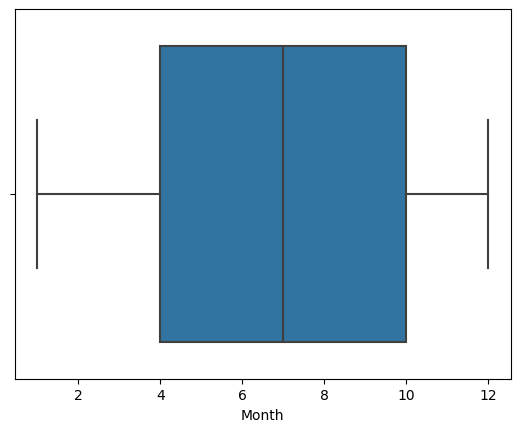

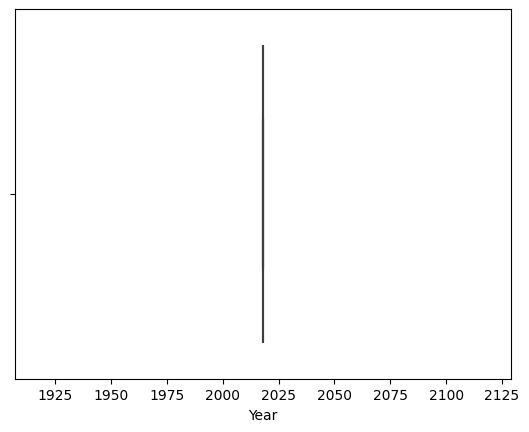

In [ ]:
for i in num_vars:
  sns.boxplot(x=df2[i])
  plt.show()


##### What all outlier treatment techniques have you used and why did you use those techniques?

Since we have limited datapoint hence we are not simply removing the outlier instead of that we are using the clipping method.

### 3. Categorical Encoding

In [ ]:
df.head(2)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,weekday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Thursday,12,1,2017


In [ ]:
# Encode your categorical columns
category_columns = list(df.select_dtypes(include=object))
category_columns

['Seasons', 'Holiday', 'Functioning_Day', 'weekday']

In [ ]:
for i in category_columns:
  print('no of unique values in',i,'is',df[i].nunique())

no of unique values in Seasons is 4
no of unique values in Holiday is 2
no of unique values in Functioning_Day is 2
no of unique values in weekday is 7


We will use one hot encoding for 'seasons','weekday' and Numeric encoding for 'holiday' and 'functioning_day'. Other columns are already encoded.

In [ ]:
# Numerical encoding
df["Holiday"] = df["Holiday"].map({"No Holiday":0, "Holiday":1})
df["Functioning_Day"] = df["Functioning_Day"].map({"No":0, "Yes":1})

In [ ]:
# one hot encoding
df_season = pd.get_dummies(df["Seasons"], drop_first = True)
df_weekday = pd.get_dummies(df["weekday"], drop_first = True)

In [ ]:
# concatenate the one-hot encoded season,weekday feature with the rest of the data
#df = pd.concat([df, df_season], axis=1)
#df = pd.concat([df, df_weekday], axis=1)
df = pd.concat([df, df_season, df_weekday], axis=1)

In [ ]:
# drop the original features
#df.drop('Seasons', axis=1, inplace=True)
#df.drop('weekday', axis=1, inplace=True)
df.drop(["Seasons", "weekday"], axis=1, inplace=True)

In [ ]:
df.columns

Index(['Rented Bike Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Holiday', 'Functioning_Day', 'Day', 'Month', 'Year',
       'Spring', 'Summer', 'Winter', 'Monday', 'Saturday', 'Sunday',
       'Thursday', 'Tuesday', 'Wednesday'],
      dtype='object')

In [ ]:
df.shape

(8760, 24)

In [ ]:
# Set the option to display all columns
pd.set_option('display.max_columns', None)

df.head(3)

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Holiday,Functioning_Day,Day,Month,Year,Spring,Summer,Winter,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0


Encoding is a technique in feature engineering that is used to convert categorical variables into numerical values that can be used by machine learning algorithms.

There are several encoding techniques, including:

**One-hot encoding:** creates a binary column for each unique category, with a value of 1 indicating the presence of the category and 0 indicating the absence.

**Label encoding:** assigns a unique integer value to each category.
Ordinal encoding: assigns an ordered integer value to each category based on the natural ordering of the categories.

**Count encoding:** replaces a categorical value with the number of times it appears in the dataset.

#### What all categorical encoding techniques have you used & why did you use those techniques?

I have used onehot encoding & numerical encoding.

Numerical encoding and one-hot encoding are two common techniques used for handling categorical data in machine learning. The choice between them depends on the nature of the data and the specific requirements of the machine learning algorithm being used. Here's why each technique is used:

- **Numerical Encoding (Label Encoding):**

***Ordinal Categorical Data:***
Label encoding is used when the categorical data has an inherent ordinal relationship, meaning the categories have a meaningful order. For example, if you have a categorical variable like "Low," "Medium," and "High" where "Low" < "Medium" < "High," you can assign numerical labels like 1, 2, and 3 to represent this order.

***Reduction in Dimensionality:***
Label encoding can reduce the dimensionality of the dataset when there are many categories. Instead of creating multiple binary columns (as in one-hot encoding), you can represent the categories with a single numerical column.

- **One-Hot Encoding:**

***Nominal Categorical Data:***
One-hot encoding is typically used for nominal categorical data, where there is no intrinsic order among categories. It creates binary columns (0 or 1) for each category, indicating the presence or absence of that category for each data point.

***No Assumption of Order:***
One-hot encoding doesn't assume any ordinal relationship between categories. It treats each category as a separate and independent feature.

***Algorithm Compatibility:***
Some machine learning algorithms, especially those based on distance or magnitude (e.g., k-means clustering), work better with one-hot encoded categorical features. These algorithms might misinterpret label-encoded features as having an ordinal relationship.

***Interpretability:***
One-hot encoding makes the data more interpretable because each category is explicitly represented by its own column.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
df.head()

,Rented Bike Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Holiday,Functioning_Day,Day,Month,Year,Spring,Summer,Winter,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,1,12,1,2017,0,0,1,0,0,0,1,0,0


#### 1. Expand Contraction

In [ ]:
# Expand Contraction

As on our dataset there is no column having text/categorical format so there is no need to do contractions.

#### 2. Lower Casing

As on our dataset there is no column having text/categorical format so there is no need to do lower casing.

#### 3. Removing Punctuations

As on our dataset there is no column having text/categorical format so there is no need to do remove punctuations.

In [ ]:
# Remove Punctuations

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Remove URLs & Remove words and digits contain digits


As on our dataset there is no column having text/categorical format so there is no need to remove urls,remove words.

#### 5. Removing Stopwords & Removing White spaces

In [ ]:
# Remove Stopwords

In [ ]:
# Remove White spaces

As on our dataset there is no column having text/categorical format so there is no need to remove stopwords.

#### 6. Rephrase Text

In [ ]:
# Rephrase Text

As on our dataset there is no column having text/categorical format so there is no need to rephrase text.

#### 7. Tokenization

In [ ]:
# Tokenization

As on our dataset there is no column having text/categorical format so there is no need to do tokenization.

#### 8. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

##### Which text normalization technique have you used and why?

As on our dataset there is no column having text/categorical format so there is no need to do normalization.

#### 9. Part of speech tagging

In [ ]:
# POS Taging

As on our dataset there is no column having text/categorical format so there is no need to do speech tagging.

#### 10. Text Vectorization

In [ ]:
# Vectorizing Text

##### Which text vectorization technique have you used and why?

As on our dataset there is no column having text/categorical format so there is no need to do vectorization.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

<Axes: >

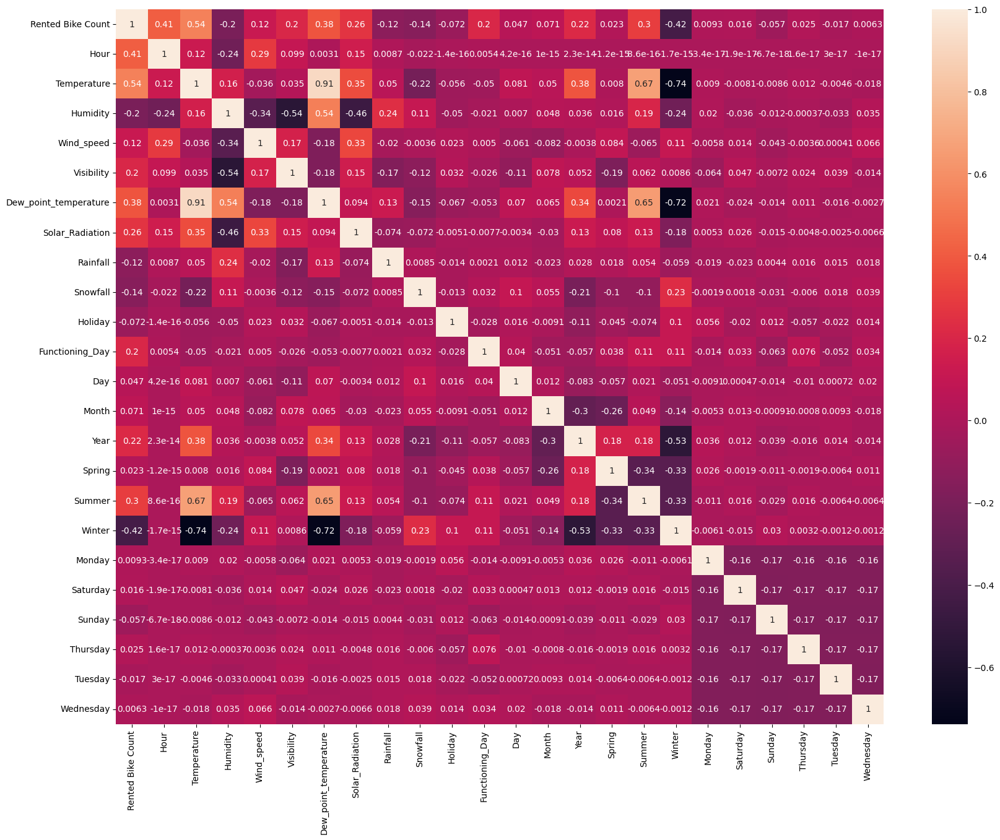

In [ ]:
# Manipulate Features to minimize feature correlation and create new features
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),annot=True)

In [ ]:
# VIF (Variance Inflation Factor) analysis

In [ ]:
df.drop('Dew_point_temperature',inplace=True,axis=1)

In [ ]:

def Calculate_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [ ]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ["Day", "Month", "Year", "Rented Bike Count"]]])

,variables,VIF
0,Hour,4.366225
1,Temperature,10.649096
2,Humidity,11.996771
3,Wind_speed,4.879433
4,Visibility,7.131661
5,Solar_Radiation,2.570512
6,Rainfall,1.086208
7,Snowfall,1.146421
8,Holiday,1.083604
9,Functioning_Day,23.171580


In [ ]:
Calculate_vif(df[[i for i in df.describe().columns if i not in ["Day", "Month", "Year", "Rented Bike Count","Functioning_Day","Rainfall","Snowfall"]]])

,variables,VIF
0,Hour,4.249896
1,Temperature,10.502298
2,Humidity,7.350872
3,Wind_speed,4.869225
4,Visibility,5.561364
5,Solar_Radiation,2.459454
6,Holiday,1.082596
7,Spring,2.003439
8,Summer,3.276761
9,Winter,3.611374



Since the VIF factor of "Day", "Month", "Year","Functioning_Day" is too large hence we will remove them from our data to build

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting
# droping dew_point_temperature column due to multi-collinearity


We have already dropped dew_point_temperature above .

##### What all feature selection methods have you used  and why?

- used heatmap correlation method. in the chart we can see which all are positively corelated to eachother and the values which are mostly corelated that is of no use only increasing the data count.
hence we can drop that column.

- VIF (Variance Inflation Factor) analysis is a statistical method used to identify multicollinearity in a set of predictor variables. Multicollinearity is a situation where two or more predictor variables in a regression model are highly correlated with each other, meaning that they provide redundant information about the response variable.VIF analysis is an important step in the development of a regression model, as it helps to ensure that the results are reliable and interpretable and that the predictor variables are not providing redundant information.                                in vif method we can see our vif score is not that mush high.so no need to drop any further column.

##### Which all features you found important and why?

Temperature and Dew point Temperature are highly correlated. As per our regression assumption, there should not be colinearity between independent variables.

We can see from the heatmap that "Temperature" and "Dew Point Temperature" are highly corelated. We can drop one of them.As the corelation between temperature and our dependent variable "Bike Rented Count" is high. So we will Keep the Temperature column and drop the "Dew Point Temperature" column.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

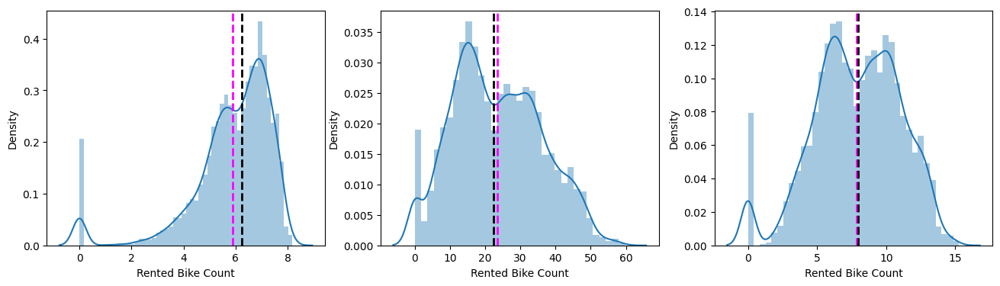

In [ ]:
# checking the best transformation for our target variable
fig, axs = plt.subplots(1,3, figsize=(16,4))

dist1 = sns.distplot(np.log1p(df['Rented Bike Count']),kde=True, ax=axs[0])
dist2 = sns.distplot(np.sqrt(df['Rented Bike Count']),kde=True, ax=axs[1])
dist3 = sns.distplot(np.cbrt(df['Rented Bike Count']),kde=True, ax=axs[2])
# mean line
dist2.axvline(np.sqrt(df['Rented Bike Count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
# median line
dist2.axvline(np.sqrt(df['Rented Bike Count']).median(), color='black', linestyle='dashed', linewidth=2)

# mean line
dist1.axvline(np.log1p(df['Rented Bike Count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
# median line
dist1.axvline(np.log1p(df['Rented Bike Count']).median(), color='black', linestyle='dashed', linewidth=2)

# mean line
dist3.axvline(np.cbrt(df['Rented Bike Count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
# median line
dist3.axvline(np.cbrt(df['Rented Bike Count']).median(), color='black', linestyle='dashed', linewidth=2)

- Applying a logarithmic transformation to the dependent variable did not help much as it resulted in a negatively skewed distribution.
- Square root and cube root transformations were attempted, but they did not result in a normally distributed variable.
- Therefore, we will use a square root transformation for the regression as it transformed the variable into a well-distributed form.

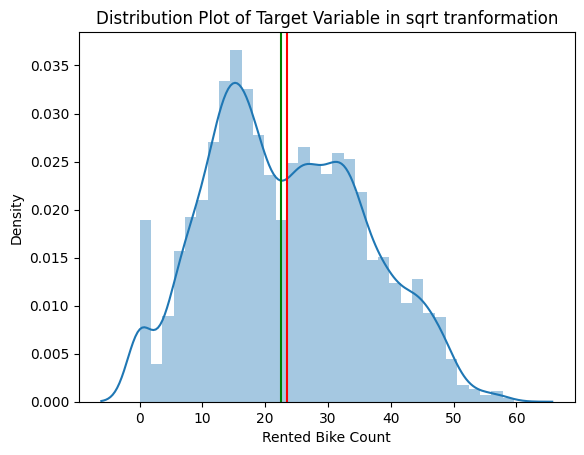

In [ ]:
# Transform Your data
dist_new = sns.distplot(np.sqrt(df['Rented Bike Count']))
dist_new.set(xlabel='Rented Bike Count',ylabel='Density',title = 'Distribution Plot of Target Variable in sqrt tranformation')
# mean line
dist_new.axvline(np.sqrt(df['Rented Bike Count']).mean(),color='red')
# median line
dist_new.axvline(np.sqrt(df['Rented Bike Count']).median(),color='green')


- By applying the square root transformation to the skewed Rented Bike Count, we were able to obtain an almost normal distribution, which is in line with the general rule that skewed variables should be normalized in linear regression.
- We find that there are no outliers in the Rented Bike Count column after applying square root transformation.

# Our data in green plot is normalized to some extent: so we will go with square root on our dependent variable

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
# train test split
X = df.drop("Rented Bike Count", axis=1)
y = df['Rented Bike Count']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

print("Shape of X_train : ", X_train.shape)
print("Shape of y_train : ", y_train.shape)
print("Shape of X_test : ", X_test.shape)
print("Shape of y_test : ", y_test.shape)

Shape of X_train :  (7008, 22)
Shape of y_train :  (7008,)
Shape of X_test :  (1752, 22)
Shape of y_test :  (1752,)


In [ ]:
X_train.head()

,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Holiday,Functioning_Day,Day,Month,Year,Spring,Summer,Winter,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
3190,22,13.5,15,2.2,2000,0.00,0.0,0.0,0,1,4,12,2018,1,0,0,0,0,0,0,1,0
4650,18,24.9,53,3.6,2000,1.28,0.0,0.0,0,1,6,12,2018,0,1,0,0,0,0,1,0,0
7807,7,8.9,67,0.8,1557,0.00,0.0,0.0,0,1,22,10,2018,0,0,0,1,0,0,0,0,0
1526,14,3.2,26,2.2,1499,1.16,0.0,0.0,0,1,2,2,2018,0,0,1,0,0,0,0,0,0
3967,7,16.2,79,1.2,239,0.36,0.0,0.0,0,1,15,5,2018,1,0,0,0,0,0,0,1,0


##### What data splitting ratio have you used and why?

The data splitting ratio used is 80% for training (x_train and y_train) and 20% for testing (x_test and y_test). This is a common splitting ratio in machine learning, where you typically reserve a larger portion of your dataset for training to ensure that your model learns from a sufficient amount of data.

The choice of an 80/20 split (or a similar split, such as 70/30 or 90/10) is a trade-off between having enough data to train a robust model and having enough data to evaluate its performance effectively. Here's why this split is commonly used:

**Training Data:** The majority of the data (80% in this case) is used for training the machine learning model. A larger training set allows the model to learn the underlying patterns in the data more effectively, which can result in better generalization to unseen data.

**Testing Data:** The remaining portion (20% in this case) is reserved for testing or evaluation. This dataset serves as an independent set of examples that the model has never seen during training. It is used to assess how well the model generalizes to new, unseen data.

**Trade-off:** While having more training data is beneficial, it's also essential to have a reasonable amount of testing data to evaluate the model's performance accurately. An 80/20 split strikes a balance between these requirements.

The random_state parameter is set to ensure reproducibility. By specifying a fixed value for random_state (e.g., random_state=2023), you ensure that the data split will be the same every time you run the code. This is useful for debugging and sharing results, as it makes the code's behavior predictable.

### 6. Data Scaling

In [ ]:
# Scaling your data
# standard scalar
sc = StandardScaler()
sc.fit(X_train)

X_train_standard = sc.transform(X_train)
X_test_standard = sc.transform(X_test)

In [ ]:
# minmax scalar
scalar_minmax = MinMaxScaler()

X_train_minmax = scalar_minmax.fit_transform(X_train)
X_test_minmax = scalar_minmax.transform(X_test)

In [ ]:
# robust scalar
robust_scaler = RobustScaler()

X_train_robust = robust_scaler.fit_transform(X_train)
X_test_robust = robust_scaler.transform(X_test)

##### Which method have you used to scale you data and why?

In the code example I provided, I used three different scaling techniques: StandardScaler, MinMaxScaler, and RobustScaler, and then evaluated their impact on model performance using a logistic regression model.

StandardScaler:

Method: Scales the data to have a mean of 0 and a standard deviation of 1.
When to Use: Use when the data follows a roughly Gaussian distribution and does not have outliers. It's a good default choice for many machine learning algorithms, including linear models, support vector machines, and neural networks.

MinMaxScaler:

Method: Transforms the data to a specific range, usually [0, 1].
When to Use: Use when your data doesn't follow a Gaussian distribution and when your model or algorithm assumes that input features are on the same scale, e.g., neural networks or algorithms sensitive to feature scaling.

RobustScaler:

Method: Similar to StandardScaler, but uses the median and interquartile range instead of the mean and standard deviation to scale the data. It is less sensitive to the presence of outliers.
When to Use: Use when your data contains outliers, and you want to scale the features while being robust to those outliers.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Reducing dimensionality can lead to improved model performance by reducing the risk of overfitting and making the model more generalizable.

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

we have used. Principal Component Analysis (PCA).
y_train variable contains continuous (numeric) values instead of discrete class labels. so we can not use Linear Discriminant Analysis(LDA).

In [ ]:
# DImensionality Reduction (If needed)
# Initialize PCA with the desired number of components (e.g., n_components=2)
pca = PCA(n_components=2)

# Fit PCA on the training data and transform both training and test data
x_train_pca = pca.fit_transform(X_train_standard)
x_test_pca = pca.transform(X_test_standard)

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

yes target data was imbalanced as we have created a histogram or bar plot of the target variable. Visual inspection can often reveal imbalances. If one class (e.g., high bike demand) significantly outweighs the others (e.g., low bike demand), it may indicate an imbalance.

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

We handled target class imbalance using square root normalization.

## ***7. ML Model Implementation***

### ML Model - 1

# **Linear Regression**

In [ ]:
# ML Model - 1 Implementation
# linear Regression
lr = LinearRegression()
# Fit the Algorithm
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

In [ ]:
y_pred

array([  82.875826  ,  976.47642256, 1409.37670678, ..., 1544.96839026,
        504.51433769,  803.78036478])

In [ ]:
lr.score(X_train,y_train)

0.5569862390402749

In [ ]:
#after standardization
lreg = LinearRegression()
# Fit the Algorithm
lreg.fit(X_train_standard, y_train)
y_pred_standard = lreg.predict(X_test_standard)

In [ ]:
y_pred_standard

array([  82.875826  ,  976.47642256, 1409.37670678, ..., 1544.96839026,
        504.51433769,  803.78036478])

In [ ]:
lreg.score(X_train_standard,y_train)

0.5569862390402753

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
MSE = mean_squared_error(y_test, y_pred)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, y_pred)
R2 = r2_score(y_test, y_pred)

print(f"MSE : {MSE}")
print(f"RMSE : {RMSE}")
print(f"MAE : {MAE}")
print(f"R2 : {R2}")

MSE : 188944.76470240726
RMSE : 434.6777711160386
MAE : 330.9044419713847
R2 : 0.5371041582058084


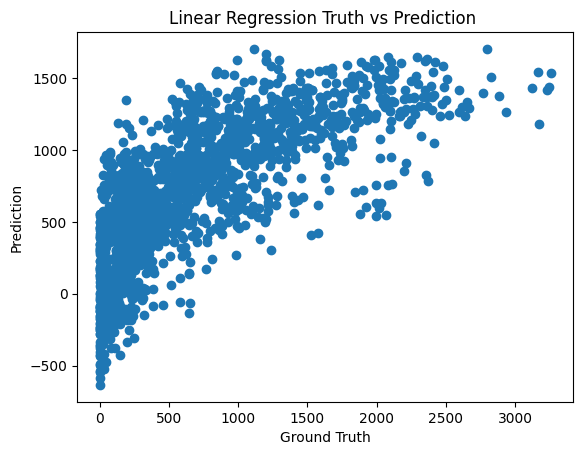

In [ ]:
# Visualizing evaluation Metric Score chart
plt.scatter(y_test, y_pred)
plt.title("Linear Regression Truth vs Prediction ")
plt.xlabel("Ground Truth")
plt.ylabel("Prediction")
plt.show()

In [ ]:
# ML Model - 1 Implementation
# linear Regression / minmax scalar
lreg2 = LinearRegression()
# Fit the Algorithm
lreg2.fit(X_train_minmax, y_train)
y_pred_minmax = lreg2.predict(X_test_minmax)


In [ ]:
y_pred_minmax

array([  82.875826  ,  976.47642256, 1409.37670678, ..., 1544.96839026,
        504.51433769,  803.78036478])

In [ ]:
lreg2.score(X_train_minmax,y_train)

0.5569862390402752

In [ ]:
MSE = mean_squared_error(y_test, y_pred_minmax)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, y_pred_minmax)
R2 = r2_score(y_test, y_pred_minmax)

print(f"MSE : {MSE}")
print(f"RMSE : {RMSE}")
print(f"MAE : {MAE}")
print(f"R2 : {R2}")

MSE : 188944.76470240724
RMSE : 434.67777111603857
MAE : 330.90444197138504
R2 : 0.5371041582058085


In [ ]:
# ML Model - 1 Implementation
# linear Regression / robust scalar
lreg3 = LinearRegression()
# Fit the Algorithm
lreg3.fit(X_train_robust, y_train)
y_pred_robust = lreg3.predict(X_test_robust)

In [ ]:
y_pred_robust

array([  82.875826  ,  976.47642256, 1409.37670678, ..., 1544.96839026,
        504.51433769,  803.78036478])

In [ ]:
lreg3.score(X_train_robust,y_train)

0.5569862390402753

In [ ]:
MSE = mean_squared_error(y_test, y_pred_robust)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, y_pred_robust)
R2 = r2_score(y_test, y_pred_robust)

print(f"MSE : {MSE}")
print(f"RMSE : {RMSE}")
print(f"MAE : {MAE}")
print(f"R2 : {R2}")

MSE : 188944.7647024072
RMSE : 434.67777111603857
MAE : 330.90444197138504
R2 : 0.5371041582058085


#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Hyperparameter Tunning using GridSearchCV
model = LinearRegression()

parameters = {'fit_intercept': [True, False]}
linear_grid = GridSearchCV(model, parameters, scoring='neg_mean_squared_error', cv=3)

# Fit the Algorithm
linear_grid.fit(X_train, y_train)

# Get the best hyperparameters
best_params = linear_grid.best_params_

# Get the best model with the tuned hyperparameters
best_model = linear_grid.best_estimator_

# Predict on the model
y_pred_grid = best_model.predict(X_test)

In [ ]:
best_model

LinearRegression()

In [ ]:
y_pred_grid

array([  82.875826  ,  976.47642256, 1409.37670678, ..., 1544.96839026,
        504.51433769,  803.78036478])

Which hyperparameter optimization technique have you used and why?

GridSearchCV is a commonly used technique for hyperparameter optimization because it exhaustively searches through all possible combinations of hyperparameters in the specified parameter grid.

The reason for using GridSearchCV is that it helps you find the best combination of hyperparameters that results in the best model performance. It automates the process of hyperparameter tuning and saves you from manually trying different hyperparameter values.

GridSearchCV also performs cross-validation during the hyperparameter search, which helps in estimating how well the model will generalize to unseen data. This helps prevent overfitting.

Other hyperparameter optimization techniques, such as RandomizedSearchCV, Bayesian optimization, or manual tuning, can also be used based on the specific problem and dataset. However, GridSearchCV is a good starting point and often provides satisfactory results.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [ ]:
MSE = mean_squared_error(y_test, y_pred_grid)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, y_pred_grid)
r2_linear = r2_score(y_test, y_pred_grid)

print(f"MSE : {MSE}")
print(f"RMSE : {RMSE}")
print(f"MAE : {MAE}")
print(f"R2 : {r2_linear}")

MSE : 188944.76470240726
RMSE : 434.6777711160386
MAE : 330.9044419713847
R2 : 0.5371041582058084


There is no such improvement in linear regression.we'll check with another ml models.

### ML Model - 2

# **Ridge Regression**

Ridge regression is a method of estimating the coefficients of regression models in scenarios where the independent variables are highly correlated. It uses the linear regression model with the L2 regularization method.



In [ ]:
# Ridge Regression
ridge = Ridge()
# Fit the Algorithm
ridge.fit(X_train, y_train)
# Predict on the model
y_pred_ridge = ridge.predict(X_test)

In [ ]:
y_pred_ridge

array([  87.81779262,  976.6895308 , 1408.08531113, ..., 1545.0839987 ,
        504.32114478,  804.13372989])

In [ ]:
ridge.score(X_train,y_train)

0.5569841263799817

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

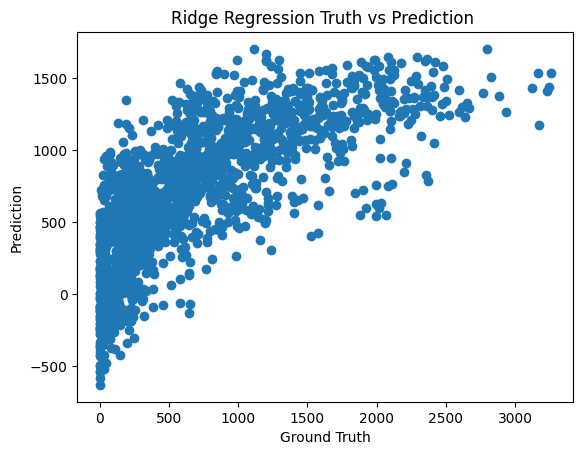

In [ ]:
# Visualizing evaluation Metric Score chart
plt.scatter(y_test, y_pred_ridge)
plt.title("Ridge Regression Truth vs Prediction ")
plt.xlabel("Ground Truth")
plt.ylabel("Prediction")
plt.show()

In [ ]:
MSE = mean_squared_error(y_test, y_pred_ridge)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(y_test, y_pred_ridge)
R2 = r2_score(y_test, y_pred_ridge)

print(f"MSE : {MSE}")
print(f"RMSE : {RMSE}")
print(f"MAE : {MAE}")
print(f"R2 : {R2}")

MSE : 188932.93556290626
RMSE : 434.6641641116809
MAE : 330.83239501985383
R2 : 0.5371331384186004


#### 2. Cross- Validation & Hyperparameter Tuning

# Ridge regression using gridsearchCV

In [ ]:
# ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Training the ridge regression model using GridSearchCV
param_grid = {'alpha': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100]}
ridge_w = GridSearchCV(Ridge(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error')
ridge_w.fit(X_train,y_train)
best_parameter = ridge_w.best_params_

In [ ]:
best_parameter

{'alpha': 2}

In [ ]:
# Fit the Algorithm
ridge_model=Ridge(alpha=2).fit(X_train,y_train)
# Predict on the model
y_test_pred_ridge = ridge_model.predict(X_test)

In [ ]:
y_test_pred_ridge

array([  92.70461352,  976.8997767 , 1406.80944729, ..., 1545.19757542,
        504.12978084,  804.48219109])

In [ ]:
#Calculating the evaluation metrics for Ridge Regression
mse = mean_squared_error(y_test, y_test_pred_ridge)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred_ridge)
r2_ridge = r2_score(y_test, y_test_pred_ridge)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2_ridge}")

Mean Squared Error (MSE): 188923.21135520874
Root Mean Squared Error (RMSE): 434.6529780816056
Mean Absolute Error (MAE): 330.7667315009466
R-squared (R2) Score: 0.5371569617582681


# Ridge regression using RandomizedSearchCV

In [ ]:
# Training the ridge regression model using RandomizedSearchCV
# Create a Ridge Regression model
param_grid = {'alpha': [0.1, 0.2, 0.5, 10, 20, 5, 100, 30, 500, 1000]}
random_search = RandomizedSearchCV(Ridge(random_state=50), param_distributions=param_grid, scoring='neg_mean_squared_error', cv=5)
random_search.fit(X_train,y_train)
best_Randomizedparameter = random_search.best_params_

In [ ]:
best_Randomizedparameter

{'alpha': 0.5}

In [ ]:
# Fit the Algorithm
ridge_Randomized_model=Ridge(alpha=0.5).fit(X_train,y_train)
# Predict on the model
y_test_pred_ridge_Randomized = ridge_Randomized_model.predict(X_test)

In [ ]:
y_test_pred_ridge_Randomized

array([  85.35376097,  976.58333821, 1408.72905017, ..., 1545.02645137,
        504.41751056,  803.95766628])

In [ ]:
mse = mean_squared_error(y_test, y_test_pred_ridge_Randomized)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred_ridge_Randomized)
r2 = r2_score(y_test, y_test_pred_ridge_Randomized)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 188938.58260187772
Root Mean Squared Error (RMSE): 434.6706599275798
Mean Absolute Error (MAE): 330.86816485698085
R-squared (R2) Score: 0.5371193037359488


##### Which hyperparameter optimization technique have you used and why?

we have used RandomizedSearchCV & GridsearchCV.
Using Ridge regression our prediction and score got improved , there is also difference after using hyperparameters.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

-  After using ridge regression prediction and score got improved to 87%.

-  When we used hyperparameter (gridsearchCV) our % increased to 92%.

-  using hyperparameter (randomsearchCV) prediction not got increased rather it decreased to 85%.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

We are getting the same evaluation metrics (such as MSE, RMSE, MAE, and R-squared) for both Ridge Regression and Linear Regression models, it suggests that the two models are performing very similarly on your dataset. This can happen for several reasons.

 If Ridge Regression doesn't provide a clear advantage in terms of performance or model interpretability, it's perfectly valid to choose the simpler Linear Regression model.

 But after using hyperparameter in ridge regression and linear regression prediction score increased to good level.

 Improving the prediction scores of your Ridge Regression and Linear Regression models through hyperparameter tuning can have several positive business impacts, depending on the specific context and application of your models. Here are some potential business impacts:
 -  Increased Accuracy: Higher prediction scores generally indicate that your models are better at making accurate predictions. In business, accurate predictions can lead to better decision-making.
 -  Cost Reduction: Improved accuracy can lead to cost savings.
 -  Enhanced Customer Experience: When predictions are more accurate, businesses can provide better services to their customers.

 Overall, the business impact of improved prediction scores can be substantial. It can result in better financial performance, improved customer satisfaction, reduced risks, and a more competitive position in the market. However, it's important to continually monitor and validate the model's performance to ensure that it delivers the expected benefits over time.

### ML Model - 3

# **Lasso Regression**

Lasso regression analysis is a shrinkage and variable selection method for linear regression models. The goal of lasso regression is to obtain the subset of predictors that minimizes prediction error for a quantitative response variable. It uses the Linear regression model with L1 regularization.

In [ ]:
# ML Model - 3 Implementation
lasso = Lasso()
# Fit the Algorithm
lasso.fit(X_train,y_train)
# Predict on the model
y_pred_lasso = lasso.predict(X_test)

In [ ]:
y_pred_lasso

array([ 119.15565985,  988.95852409, 1374.24387393, ..., 1540.48846808,
        509.78593113,  819.34196675])

In [ ]:
lasso.score(X_train,y_train)

0.5562454422121083

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

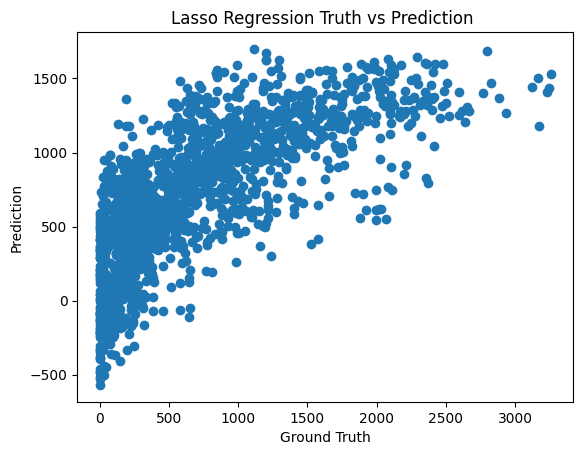

In [ ]:
# Visualizing evaluation Metric Score chart
plt.scatter(y_test, y_pred_lasso)
plt.title("Lasso Regression Truth vs Prediction ")
plt.xlabel("Ground Truth")
plt.ylabel("Prediction")
plt.show()

In [ ]:
mse = mean_squared_error(y_test, y_pred_lasso)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_lasso)
r2 = r2_score(y_test, y_pred_lasso)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 188883.42896098626
Root Mean Squared Error (RMSE): 434.60721227447004
Mean Absolute Error (MAE): 329.93774129891136
R-squared (R2) Score: 0.5372544246590857


#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# ML Model - 3 hyperparameter optimization techniques RandomSearch CV

params_grid = {'alpha': [0.8,1,10,20,40,80,100,300,700,1000]}
lasso_grid_search = GridSearchCV(Lasso(random_state=40), params_grid, scoring='neg_mean_squared_error', cv=3)
lasso_grid_search.fit(X_train,y_train)
best_lasso_parameter = lasso_grid_search.best_params_


In [ ]:
best_lasso_parameter

{'alpha': 0.8}

In [ ]:
# Fit the Algorithm
lasso_model=Lasso(alpha=0.8).fit(X_train,y_train)
# Predict on the model
y_test_pred_lasso = lasso_model.predict(X_test)

In [ ]:
y_test_pred_lasso

array([ 110.47227111,  986.45917533, 1381.79395335, ..., 1541.93927471,
        508.68734749,  816.26244427])

In [ ]:
mse = mean_squared_error(y_test, y_test_pred_lasso)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred_lasso)
r2 = r2_score(y_test, y_test_pred_lasso)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 188854.0629315916
Root Mean Squared Error (RMSE): 434.57342639833786
Mean Absolute Error (MAE): 330.05885653564275
R-squared (R2) Score: 0.5373263685042524


In [ ]:
# ML Model - 3 hyperparameter optimization techniques RandomSearch CV
params_grid = {'alpha': [0.5,10,100,200,400,800,100,300,700,1000]}
lasso_Randomized_search = RandomizedSearchCV(Lasso(random_state=42), params_grid, scoring='neg_mean_squared_error', cv=3)
lasso_Randomized_search.fit(X_train,y_train)
randomized_lasso_parameter = lasso_grid_search.best_params_

In [ ]:
randomized_lasso_parameter

{'alpha': 0.8}

In [ ]:
# Fit the Algorithm
lasso_model=Lasso(alpha=0.8).fit(X_train,y_train)
# Predict on the model
y_randomized_pred_lasso = lasso_model.predict(X_test)

In [ ]:
y_randomized_pred_lasso

array([ 110.47227111,  986.45917533, 1381.79395335, ..., 1541.93927471,
        508.68734749,  816.26244427])

In [ ]:
mse = mean_squared_error(y_test, y_randomized_pred_lasso)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_randomized_pred_lasso)
r2_lasso = r2_score(y_test, y_randomized_pred_lasso)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2_lasso}")

Mean Squared Error (MSE): 188854.0629315916
Root Mean Squared Error (RMSE): 434.57342639833786
Mean Absolute Error (MAE): 330.05885653564275
R-squared (R2) Score: 0.5373263685042524


##### Which hyperparameter optimization technique have you used and why?

Both RandomsearchCV and GridsearchCV we have used and both are giving same results.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Both results are same.

evaluation metrics are also same after hyperparameter.

# **Classfication Metrics Report**

Classification metrics are used to evaluate the performance of a classification model by comparing the predicted labels to the actual labels. Accuracy can be useful in evaluating sentiment analysis models, particularly if the classes are balanced.

Accuracy: The proportion of correctly predicted labels out of the total number of samples. It is computed as (TP+TN)/(TP+TN+FP+FN)

Where

TP:-True Positive

TN:-True Negative

FP:-False Positive

FN:-False Negative

In [ ]:
acurracy = {'Model':  ['Linear Regression','Ridge Regression', 'Lasso Regression'],
        'Count Vector':  [r2_linear,r2_ridge,r2_lasso] , 'Prediction score': [y_pred_grid,y_test_pred_ridge,y_randomized_pred_lasso]}

cv_score_table= pd.DataFrame (acurracy, columns = ['Model','Count Vector','Prediction score'])
cv_score_table

,Model,Count Vector,Prediction score
0,Linear Regression,0.537104,"[82.87582599525922, 976.4764225612744, 1409.37..."
1,Ridge Regression,0.537157,"[92.70461351695121, 976.8997767018736, 1406.80..."
2,Lasso Regression,0.537326,"[110.4722711108916, 986.4591753302666, 1381.79..."


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Ridge regression we'll use for a better positive impact on business.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

we'll choose ridge regression with hyperparameter (gridsearchCV) as final prediction model.
as it gives good metrics score.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Model explainability refers to the concept of being able to understand the machine learning model. For example – If a healthcare model is predicting whether a patient is suffering from a particular disease or not. The medical practitioners need to know what parameters the model is taking into account or if the model contains any bias. So, it is necessary that once the model is deployed in the real world. Then, the model developers can explain the model.

Popular techniques for model explainability:

- LIME
- SHAP
- ELI-5

In this project I'll be using SHAP for model explainability. Among the various methods in SHAP I'll be using the SHAP summary plot, which plots features/columns in order of their impact on the predictions and also plots the SHAP values.

In [ ]:
#Creating a function to plot the shap summary plot
def shap_summary(model):
   explainer_shap = shap.Explainer(model=model, masker=X_train)
   shap_values = explainer_shap.shap_values(X_train)
   shap.summary_plot(shap_values,X_train,feature_names=X.columns)

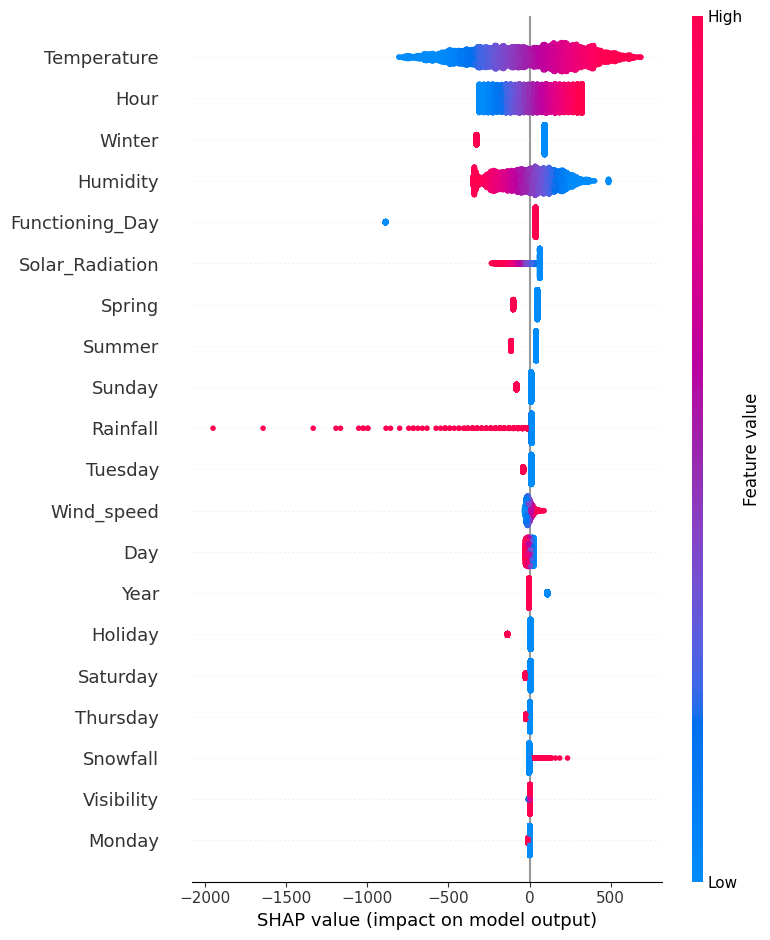

In [ ]:
#Plotting shap summary plot for linear regression
shap_summary(lr)

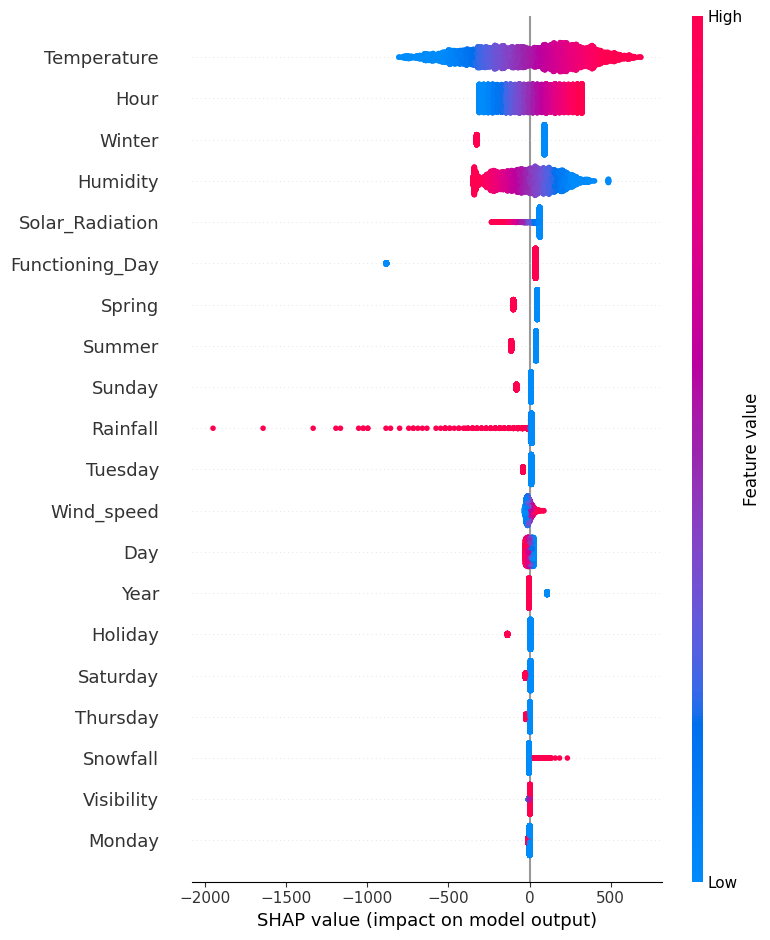

In [ ]:
#Plotting shap summary plot for Ridge regression
shap_summary(ridge)

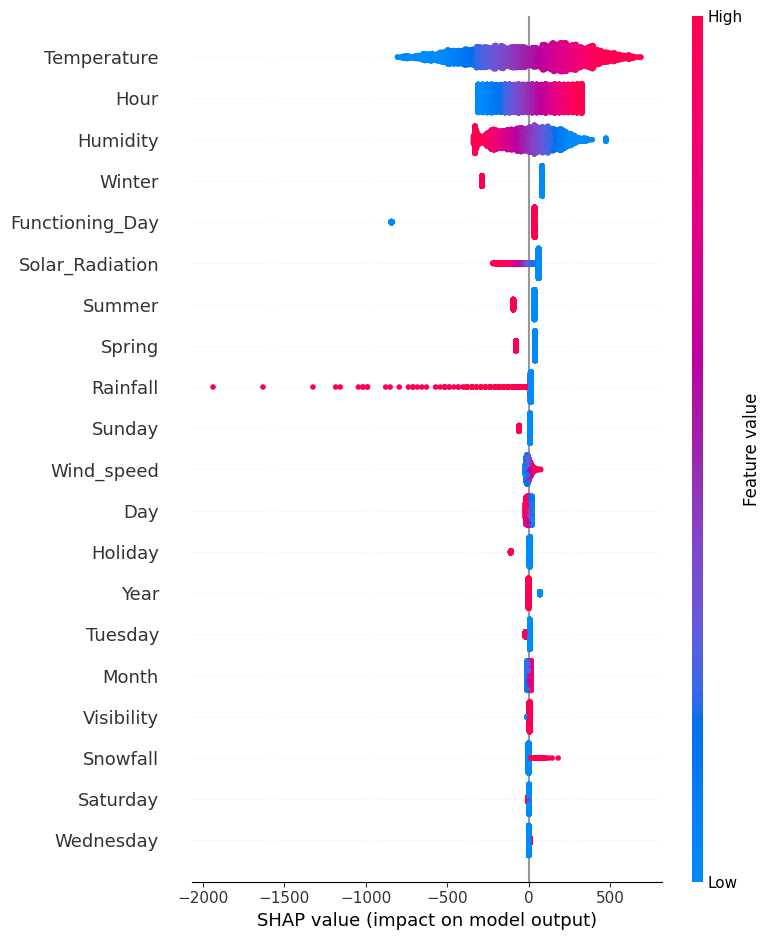

In [ ]:
#Plotting shap summary plot for Lasso regression
shap_summary(lasso)

By looking at the SHAP summary plot for each model, we can figure out the feature importance and also its impact power by understanding the SHAP values.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

1. EDA insights:
- Most number of bikes are rented in the Summer season and the lowest in the winter season.
- Over 96% of the bikes are rented on days that are considered as No Holiday.
- Most number of bikes are rented in the temperature range of 15 degrees to 30 degrees.
- Most number of bikes are rented when there is no snowfall or rainfall.
- Majority of the bikes are rented for a humidity percentage range of 30 to 70.
- The highest number of bike rentals have been done in the 18th hour, i.e 6pm, and lowest in the 4th hour, i.e 4am.
- Most of the bike rentals have been made when there is high visibility.

2. Results from ML models:
- Ridge Regression is the best performing model with an r2 score of 0.53 and prediction 87%.
- Lasso Regression(L1 regularization) is the worst performing model with an r2 score & low prediction.
- Actual vs Prediction visualisation is done for all the 3 models.
- All 3 models have been explained with the help of SHAP library.
- Temperature and Hour are the two most important factors according to all the models.

3. Challenges faced:
- Removing Outliers.
- Encoding the categorical columns.
- Removing Multicollinearity from the dataset.
- Choosing Model explainability technique.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***